# Reporte de Progreso del Análisis de Parámetros del instrumento MATISSE

Este Jupyter Notebook presenta un análisis detallado de los parámetros de trazas del instrumento MATISSE. El objetivo principal es explorar el comportamiento operacional del instrumento, identificar patrones y detectar posibles anomalías mediante la comparación sistemática entre observaciones correctas y aquellas que presentan errores.

El análisis se ha estructurado en etapas lógicas y modulares:

1. **Extracción de datos y Análisis Inicial de Parámetros Numéricos:** 
    Carga inicial de los datos, extraccion y visualización de parámetros numericos relevantes y una primera visualización para identificar tendencias y diferencias entre las observaciones sin error y con error.

2.  **Análisis de Parámetros Categóricos:** 
    Se enfoca en la extracción, codificación a formato numérico y visualización de las variables categóricas, preparándolas para análisis más avanzados

3.  **Reducción de Dimensionalidad y Clustering:** 
    .Aplicación de técnicas avanzadas como **t-SNE** y **UMAP** para reducir la complejidad de los datos y **DBSCAN** para identificar agrupaciones naturales (clusters).

Para mantener este notebook conciso, las funciones reutilizables han sido **externalizadas en módulos Python** dentro de la carpeta `src/`. 

## 1. Extracción y Análisis Inicial de Parámetros Numéricos

Durante esta primera parte se cargan los datos desde la libreria `Eliana.datasets`, para despues identificar mediante los TPL_IDs.
Para mejorar el enfonque, se separa el dataset `df_meta` en observaciones correctas y erróneas.
Posteriormente se extraen los parámetros numéricos de las trazas para su descripción y visualización.

### Importar Librerías y Funciones
Se importan las librerías necesarias y las funciones externalizadas `src/preprocesamiento`, `src/visualizacion`, `src/codificacion` y `src/clustering`.

In [2]:
import pandas as pd
import numpy as np
from eliana.datasets import ParlogsObservations
import os
import matplotlib.pyplot as plt

# Importar funciones externalizadas de la carpeta 'src'
from src.preprocesamiento import extract_params, extract_trace_parameters, cargar_y_procesar_carpeta, extract_trace_categoricals,min_max_normalizar
from src.visualizacion import graficos_por_columna
from src.codificacion import codificar_categoricas_por_columna, procesar_strval_in_memory 
from src.clustering import cluster_todos_en_conjunto,plot_clusters_por_cluster_y_origen

plt.style.use('default')
plt.rcParams['font.size'] = 10

### Cargar datos del dataset Eliana
* Instrumento: MATISSE
* Rango de tiempo: 6 meses

In [3]:
INSTRUMENT='MATISSE'
RANGE='6m'

In [4]:
logs = ParlogsObservations(period=RANGE, source="Instrument", system=INSTRUMENT)

### Información General de los DataFrames

In [5]:
df_meta = logs.meta
df_traces = logs.traces()
TPL_IDs = logs.meta['TPL_ID'].value_counts()

In [6]:
TPL_IDs_Error=df_meta[df_meta['ERROR'] == True]
print("Conteo de TPL_IDs con ERROR:\n", TPL_IDs_Error['TPL_ID'].value_counts())

Conteo de TPL_IDs con ERROR:
 TPL_ID
MATISSE_gen_tec_ali              67
MATISSE_hyb_obs                  43
MATISSE_img_acq                  39
errseverity                      27
MATISSE_img_acq_ft               23
MATISSE_gen_tec_opd              20
MATISSE_gen_cal_det_aq           15
MATISSE_gen_tec_check_fringes    10
MATISSE_gen_cal_bias              9
MATISSE_gen_cal_imbasic           6
MATISSE_gen_cal_det_h2            3
MATISSE_gen_cal_shift             3
MATISSE_gen_tec_piezos            2
MATISSE_gen_cal_kappa             2
MATISSE_gen_cal_transfunc         1
Name: count, dtype: int64


In [7]:
TPL = set(TPL_IDs.index) & set(TPL_IDs_Error['TPL_ID'])
print("TPL_IDs con errores comunes:\n", TPL)

TPL_IDs con errores comunes:
 {'MATISSE_hyb_obs', 'MATISSE_gen_cal_bias', 'MATISSE_gen_tec_opd', 'MATISSE_gen_cal_imbasic', 'MATISSE_gen_cal_shift', 'MATISSE_gen_cal_det_h2', 'MATISSE_img_acq', 'MATISSE_gen_cal_det_aq', 'MATISSE_gen_tec_ali', 'MATISSE_gen_tec_piezos', 'errseverity', 'MATISSE_img_acq_ft', 'MATISSE_gen_cal_transfunc', 'MATISSE_gen_tec_check_fringes', 'MATISSE_gen_cal_kappa'}


In [8]:
print("Conteo de errores en metadatos:\n", df_meta['ERROR'].value_counts())

Conteo de errores en metadatos:
 ERROR
False    6383
True      270
Name: count, dtype: int64


### Separación de los datos:
Se crean dos DataFrames de `df_meta`: uno para las observaciones con errores (`df_meta_Error`) y otro para las que no tienen errores (`df_meta_2`).

In [9]:
df_meta_Error = df_meta[df_meta['ERROR'] == True]

In [10]:
df_meta_2 = df_meta[~df_meta['START'].isin(df_meta_Error['START'])]

### Extracción y Almacenamiento de Parámetros Numéricos
Se extraen los parámetros numéricos de las trazas para los TPL_IDs identificados, tanto para las observaciones sin error como para las que tienen error. 

In [11]:
tpl_params_dict_ok = {}
tpl_params_dict_err = {}

threshold_nan = 0.5

for tpl_id in TPL:
    # OK
    params_df_ok = extract_trace_parameters(df_meta_2, df_traces, extract_params, tpl_id=tpl_id)
    if params_df_ok is None:
        params_df_ok = pd.DataFrame()
    params_df_ok = params_df_ok.loc[:, params_df_ok.isna().mean() < threshold_nan]
    params_df_ok = params_df_ok.loc[params_df_ok.isna().mean(axis=1) < threshold_nan, :]
    if not params_df_ok.empty:
        tpl_params_dict_ok[tpl_id] = params_df_ok

    # ERR
    params_df_err = extract_trace_parameters(df_meta_Error, df_traces, extract_params, tpl_id=tpl_id)
    if params_df_err is None:
        params_df_err = pd.DataFrame()
    params_df_err = params_df_err.loc[:, params_df_err.isna().mean() < threshold_nan]
    params_df_err = params_df_err.loc[params_df_err.isna().mean(axis=1) < threshold_nan, :]
    if not params_df_err.empty:
        tpl_params_dict_err[tpl_id] = params_df_err

    

### Descripción de Parámetros Numéricos


In [12]:
print("\n Parametros Numericos")

# Sin Error
non_empty_ok = [tpl_id for tpl_id, df in tpl_params_dict_ok.items() if not df.empty]
if non_empty_ok:
    print(f"Sin Error ({len(non_empty_ok)}): {', '.join(non_empty_ok)}")
else:
    print(" Sin Error: Ninguno")

# Con Error  
non_empty_err = [tpl_id for tpl_id, df in tpl_params_dict_err.items() if not df.empty]
if non_empty_err:
    print(f"Con Error ({len(non_empty_err)}): {', '.join(non_empty_err)}")
else:
    print(" Con Error: Ninguno")

# Estadísticas rápidas solo si hay datos
for label, data_dict in [("Sin Error", tpl_params_dict_ok), ("Con Error", tpl_params_dict_err)]:
    total_rows = sum(len(df) for df in data_dict.values() if not df.empty)
    if total_rows > 0:
        print(f"{label}: {total_rows} registros totales")


 Parametros Numericos
Sin Error (15): MATISSE_hyb_obs, MATISSE_gen_cal_bias, MATISSE_gen_tec_opd, MATISSE_gen_cal_imbasic, MATISSE_gen_cal_shift, MATISSE_gen_cal_det_h2, MATISSE_img_acq, MATISSE_gen_cal_det_aq, MATISSE_gen_tec_ali, MATISSE_gen_tec_piezos, errseverity, MATISSE_img_acq_ft, MATISSE_gen_cal_transfunc, MATISSE_gen_tec_check_fringes, MATISSE_gen_cal_kappa
Con Error (15): MATISSE_hyb_obs, MATISSE_gen_cal_bias, MATISSE_gen_tec_opd, MATISSE_gen_cal_imbasic, MATISSE_gen_cal_shift, MATISSE_gen_cal_det_h2, MATISSE_img_acq, MATISSE_gen_cal_det_aq, MATISSE_gen_tec_ali, MATISSE_gen_tec_piezos, errseverity, MATISSE_img_acq_ft, MATISSE_gen_cal_transfunc, MATISSE_gen_tec_check_fringes, MATISSE_gen_cal_kappa
Sin Error: 5956 registros totales
Con Error: 266 registros totales


### Gráficos de Parámetros Numéricos
Se generan gráficos de histogramas para comparar los parámetros numéricos entre las observaciones con y sin error, omitiendo los parámetros que se mantienen constantes en ambos grupos. Se procesan solo los archivos específicos.

Creando gráficos tipo 'histograma' para 3 parámetros NO constantes...


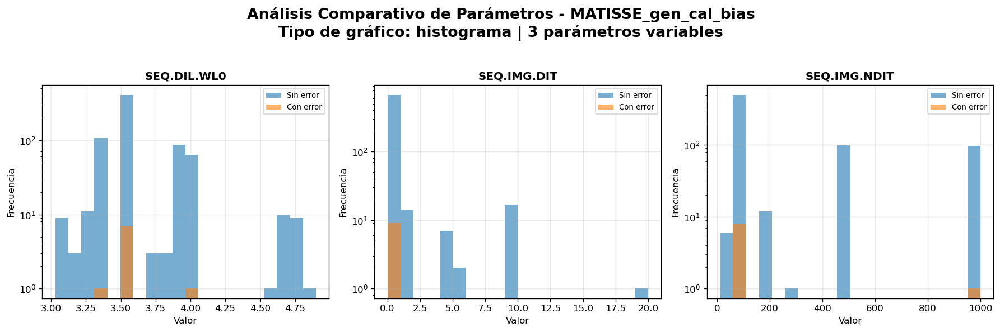

Creando gráficos tipo 'histograma' para 1 parámetros NO constantes...
Parámetros constantes (omitidos): ['DET2.NDIT', 'DET2.NDITSKIP', 'DET2.PERIOD', 'DET2.TDELAY', 'DET2.WIN.MTCS1', 'DET2.WIN.MTCW1', 'DET2.WIN.MTRH1', 'DET2.WIN.MTRS1', 'SEQ.DARK.INS.SFN.NAME', 'SEQ.LAMP.COOLDOWN', 'SEQ.LAMP.WARMUP']


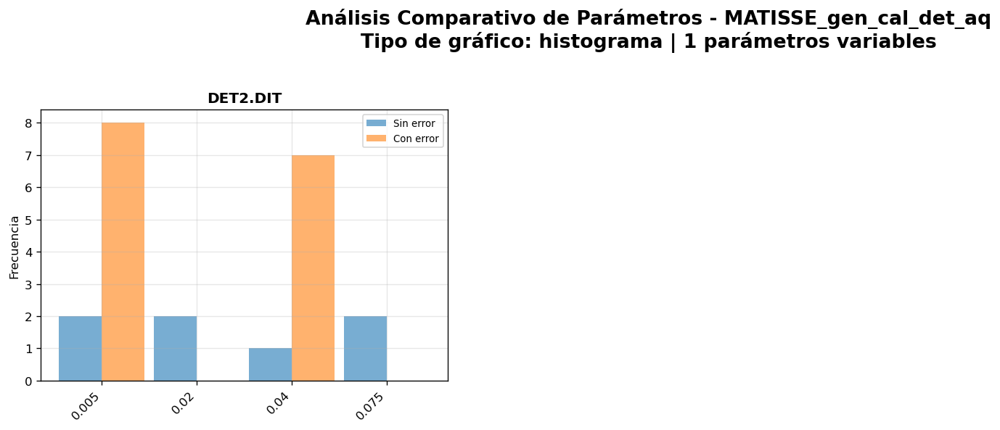

Creando gráficos tipo 'histograma' para 5 parámetros NO constantes...
Parámetros constantes (omitidos): ['DET1.NDIT', 'DET1.NDITSKIP', 'DET1.TDELAY', 'DET1.WIN.MTCS1', 'DET1.WIN.MTCW1', 'DET1.WIN.MTRH1', 'DET1.WIN.MTRS1', 'SEQ.DARK.INS.SFL.NAME']


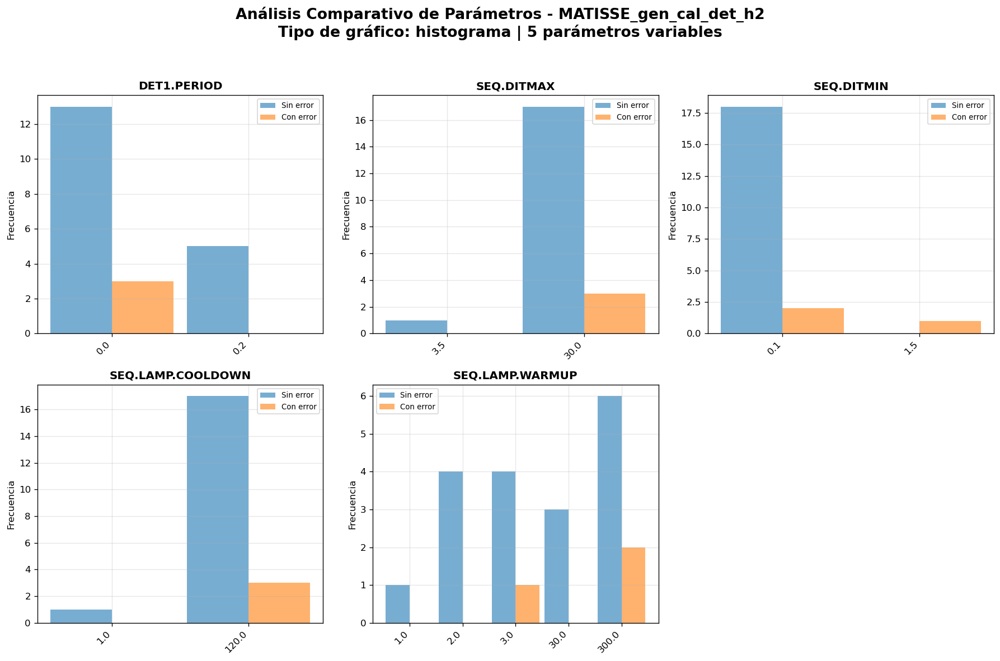

Creando gráficos tipo 'histograma' para 7 parámetros NO constantes...
Parámetros constantes (omitidos): ['DET1.NDITSKIP', 'DET1.TDELAY', 'DET1.WIN.MTCS.LIST', 'DET1.WIN.MTCW.LIST', 'DET1.WIN.NCOL', 'DET1.WIN.NROW', 'DET2.NDITSKIP', 'DET2.TDELAY', 'DET2.WIN.MTCS.LIST', 'DET2.WIN.MTCW.LIST', 'DET2.WIN.NCOL', 'DET2.WIN.NROW', 'INS.SFL.NAME', 'INS.SFN.NAME']


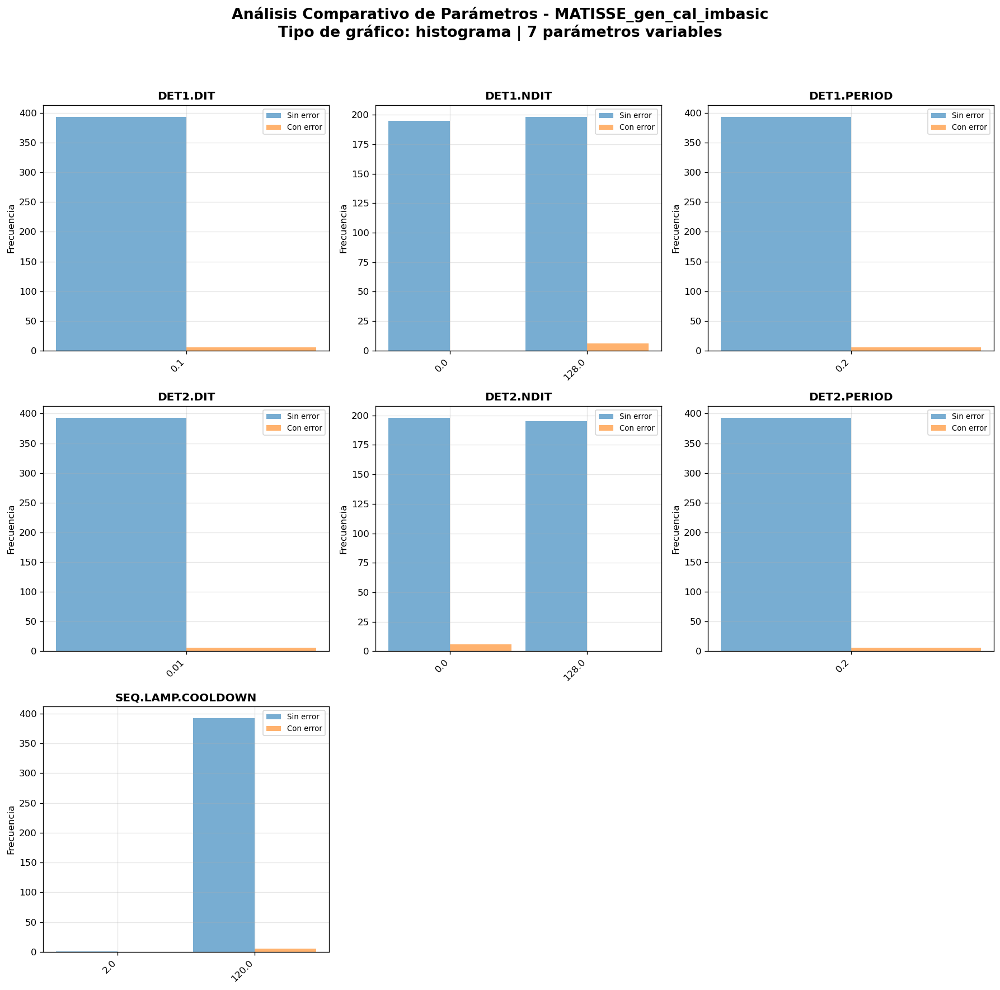

Creando gráficos tipo 'histograma' para 2 parámetros NO constantes...
Parámetros constantes (omitidos): ['DET1.NDIT', 'DET2.NDIT']


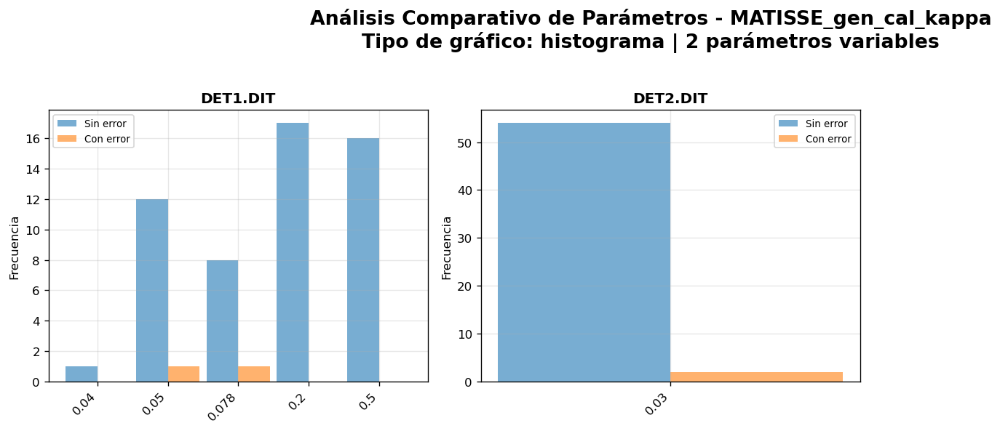

Creando gráficos tipo 'histograma' para 4 parámetros NO constantes...


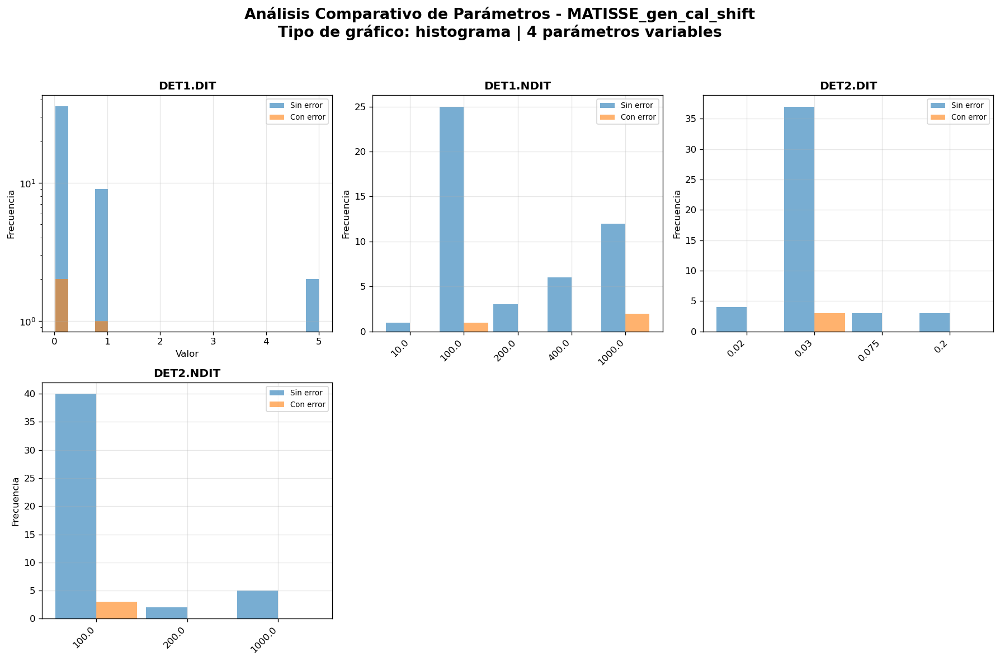

Creando gráficos tipo 'histograma' para 6 parámetros NO constantes...
Parámetros constantes (omitidos): ['DET1.APOTYPE.VAL', 'DET1.APOX.VAL', 'DET1.APOY.VAL', 'DET1.INTERFX.VAL', 'DET1.INTERFY.VAL', 'DET1.NCOHERENT.VAL', 'DET1.NINCOHERENT.VAL', 'DET1.SNRLIMIT.VAL', 'DET1.WLMAXCUT.VAL', 'DET1.WLMINCUT.VAL', 'DET2.APOTYPE.VAL', 'DET2.APOX.VAL', 'DET2.APOY.VAL', 'DET2.INTERFX.VAL', 'DET2.INTERFY.VAL', 'DET2.NCOHERENT.VAL', 'DET2.NINCOHERENT.VAL', 'DET2.SNRLIMIT.VAL', 'DET2.WLMAXCUT.VAL', 'DET2.WLMINCUT.VAL', 'INS.SFL.NAME', 'INS.SFN.NAME', 'SEQ.DIL.WL0', 'SEQ.FRINGES.NCYCLES', 'SEQ.OPDM.L.WLMAX', 'SEQ.OPDM.N.WLMAX', 'SEQ.OPDM.NSTEPS', 'TEL.CHOP.FREQ', 'TEL.CHOP.POSANG', 'TEL.CHOP.PVRATIO', 'TEL.CHOP.THROW']


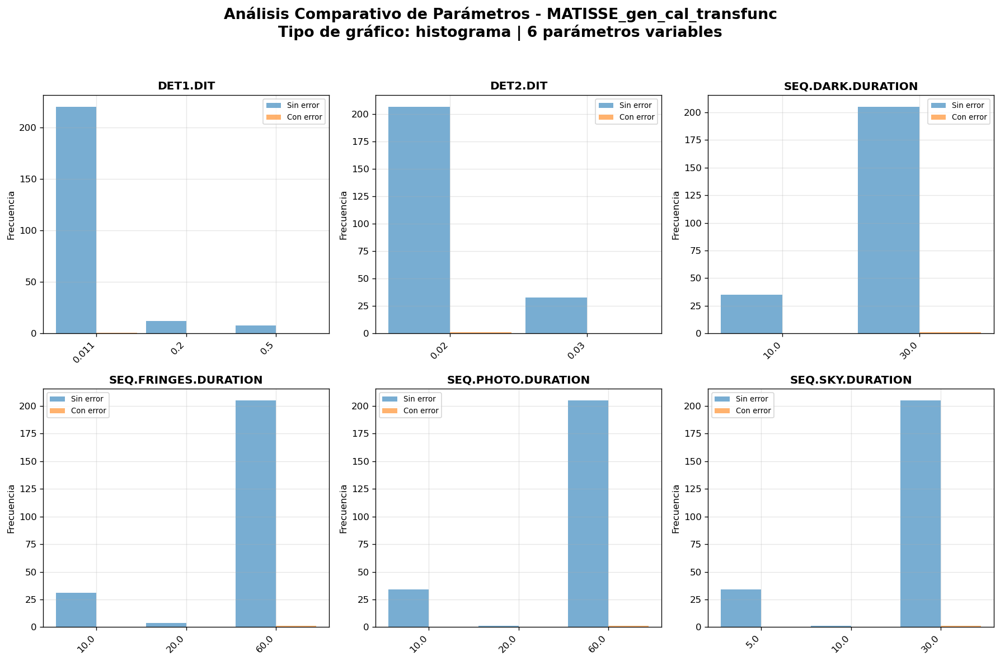

Creando gráficos tipo 'histograma' para 8 parámetros NO constantes...


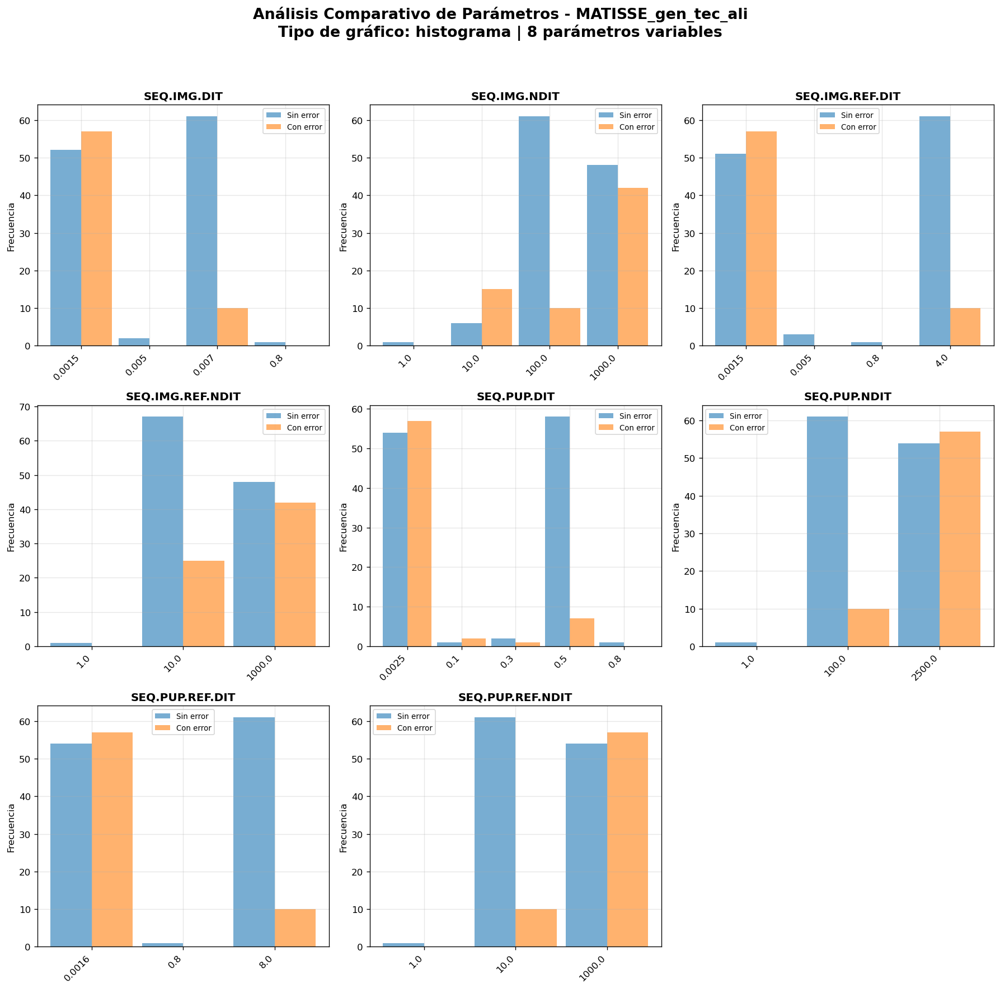

Creando gráficos tipo 'histograma' para 2 parámetros NO constantes...
Parámetros constantes (omitidos): ['DET1.APOTYPE.VAL', 'DET1.APOX.VAL', 'DET1.APOY.VAL', 'DET1.INTERFX.VAL', 'DET1.INTERFY.VAL', 'DET1.NCOHERENT.VAL', 'DET1.NDIT', 'DET1.NINCOHERENT.VAL', 'DET1.SNRLIMIT.VAL', 'DET1.WLMINCUT.VAL', 'DET2.APOTYPE.VAL', 'DET2.APOX.VAL', 'DET2.APOY.VAL', 'DET2.DIT', 'DET2.INTERFX.VAL', 'DET2.INTERFY.VAL', 'DET2.NCOHERENT.VAL', 'DET2.NDIT', 'DET2.NINCOHERENT.VAL', 'DET2.SNRLIMIT.VAL', 'DET2.WLMAXCUT.VAL', 'DET2.WLMINCUT.VAL', 'INS.SFL.NAME', 'INS.SFN.NAME', 'SEQ.DIL.WL0']


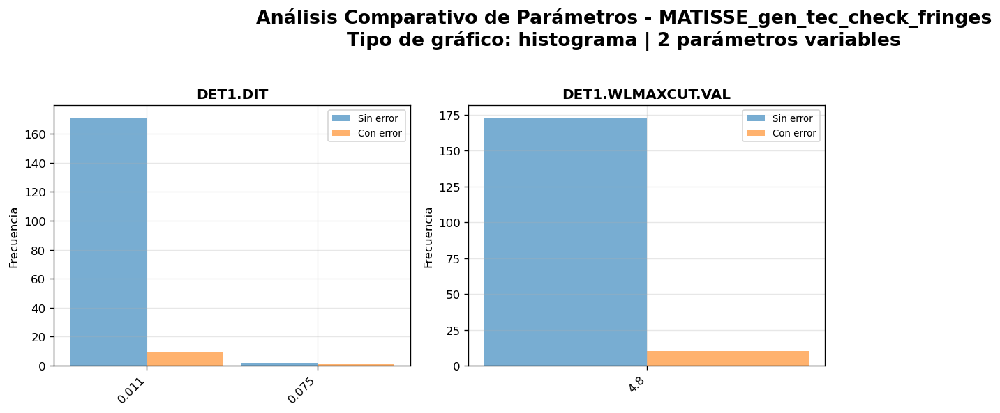

Creando gráficos tipo 'histograma' para 9 parámetros NO constantes...
Parámetros constantes (omitidos): ['DET1.APOTYPE.VAL', 'DET1.APOX.VAL', 'DET1.APOY.VAL', 'DET1.INTERFX.VAL', 'DET1.INTERFY.VAL', 'DET1.NCOHERENT.VAL', 'DET1.NINCOHERENT.VAL', 'DET1.WLMINCUT.VAL', 'DET2.APOTYPE.VAL', 'DET2.APOX.VAL', 'DET2.APOY.VAL', 'DET2.INTERFX.VAL', 'DET2.INTERFY.VAL', 'DET2.NINCOHERENT.VAL', 'DET2.WLMINCUT.VAL', 'INS.SFL.NAME', 'INS.SFN.NAME']


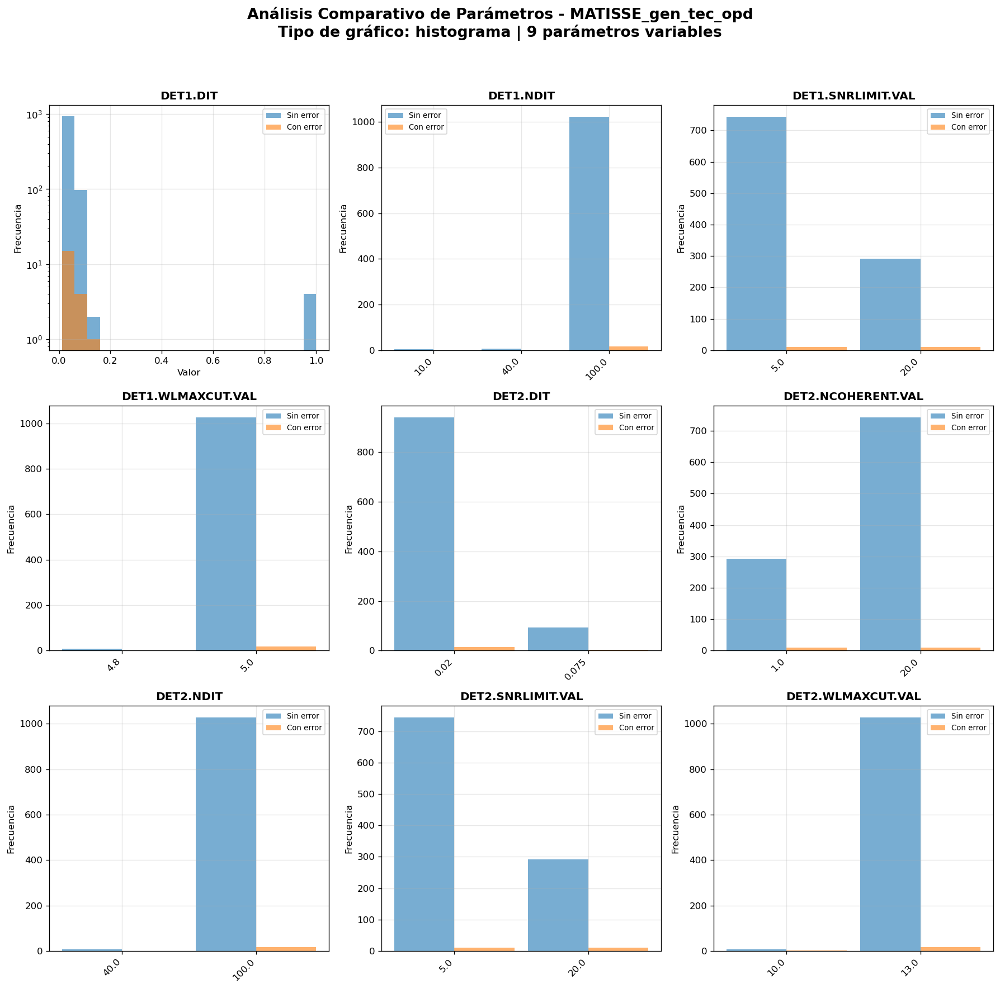

Creando gráficos tipo 'histograma' para 7 parámetros NO constantes...
Parámetros constantes (omitidos): ['INS.SFL.NAME', 'INS.SFN.NAME']


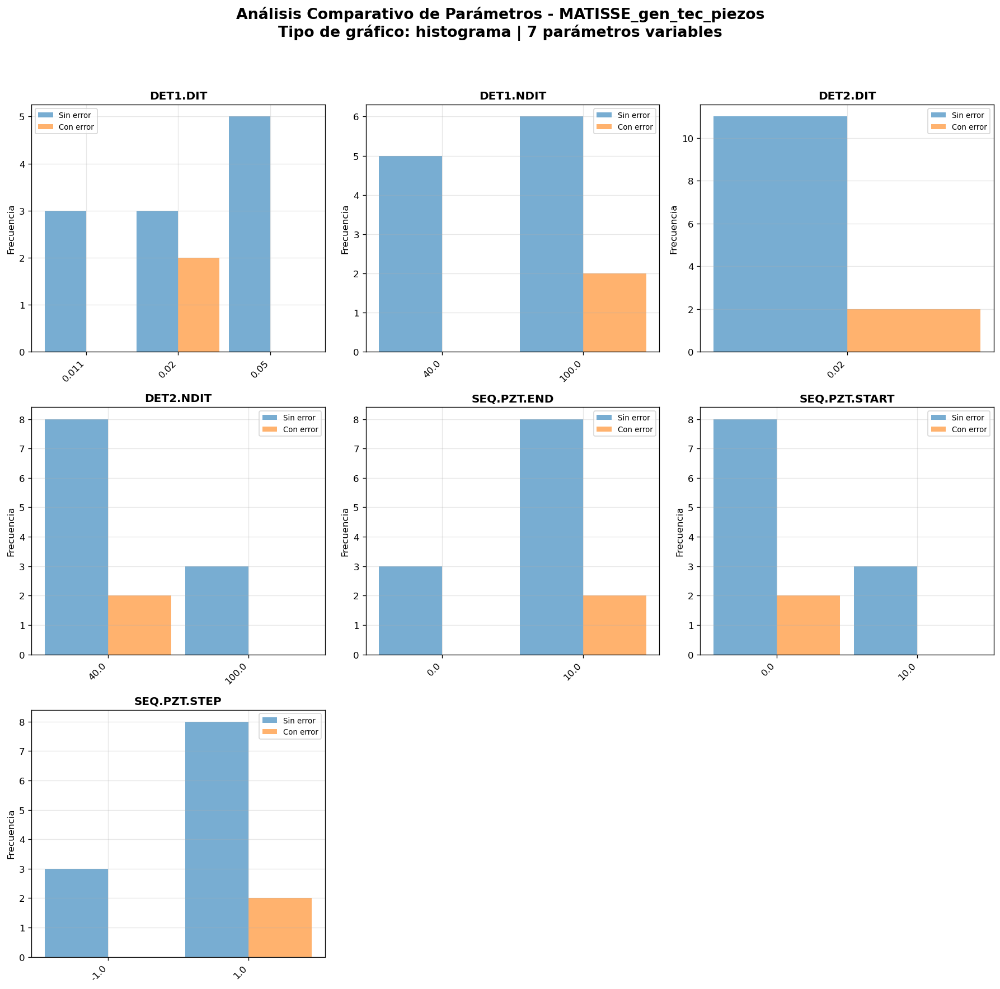

Creando gráficos tipo 'histograma' para 17 parámetros NO constantes...
Parámetros constantes (omitidos): ['DET1.APOTYPE.VAL', 'DET1.APOX.VAL', 'DET1.APOY.VAL', 'DET1.INTERFX.VAL', 'DET1.INTERFY.VAL', 'DET1.NCOHERENT.VAL', 'DET1.NINCOHERENT.VAL', 'DET1.SNRLIMIT.VAL', 'DET2.APOY.VAL', 'DET2.INTERFX.VAL', 'DET2.INTERFY.VAL', 'DET2.NCOHERENT.VAL', 'DET2.NINCOHERENT.VAL', 'DET2.SNRLIMIT.VAL', 'DET2.WLMINCUT.VAL', 'SEQ.OPDM.L.WLMAX', 'SEQ.OPDM.N.WLMAX', 'TEL.CHOP.POSANG', 'TEL.CHOP.PVRATIO']


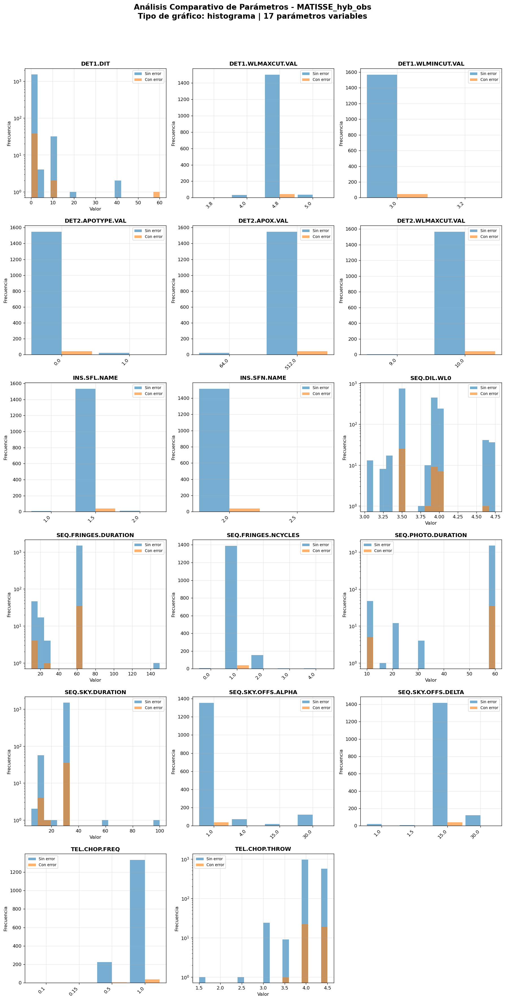

Creando gráficos tipo 'histograma' para 27 parámetros NO constantes...
Parámetros constantes (omitidos): ['COU.AG.EPOCH', 'COU.AG.EQUINOX', 'DEL.REF.OPL', 'DET1.APOTYPE.VAL', 'DET1.APOX.VAL', 'DET1.APOY.VAL', 'DET1.INTERFX.VAL', 'DET1.INTERFY.VAL', 'DET1.NCOHERENT.VAL', 'DET1.NINCOHERENT.VAL', 'DET1.SNRLIMIT.VAL', 'DET2.APOY.VAL', 'DET2.INTERFX.VAL', 'DET2.INTERFY.VAL', 'DET2.NCOHERENT.VAL', 'DET2.NINCOHERENT.VAL', 'DET2.SNRLIMIT.VAL', 'DET2.WLMAXCUT.VAL', 'DET2.WLMINCUT.VAL', 'SEQ.ACQ.SKY.DURATION', 'SEQ.ACQ.TARG.DURATION', 'SEQ.DIL.WL0', 'SEQ.FS.INS.SFN.NAME', 'SEQ.FS.SKY.DURATION', 'SEQ.OPDM.L.WLMAX', 'SEQ.OPDM.N.WLMAX', 'SEQ.PUP.SKY.DURATION', 'SEQ.PUP.TARG.DURATION', 'SEQ.SKY.OFFS.ALPHA', 'SEQ.SKY.OFFS.DELTA', 'TEL.CHOP.PVRATIO', 'TEL.GS1.ALPHA', 'TEL.GS1.DELTA', 'TEL.GS1.MAG', 'TEL.TARG.EQUINOX']


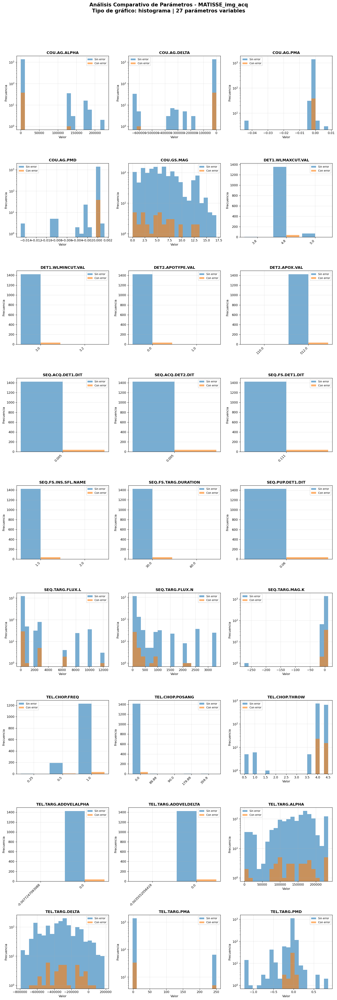

Creando gráficos tipo 'histograma' para 14 parámetros NO constantes...
Parámetros constantes (omitidos): ['COU.AG.ALPHA', 'COU.AG.DELTA', 'COU.AG.EPOCH', 'COU.AG.EQUINOX', 'COU.AG.PMA', 'COU.AG.PMD', 'DEL.REF.NAME', 'DEL.REF.OPL', 'DET1.APOTYPE.VAL', 'DET1.APOX.VAL', 'DET1.APOY.VAL', 'DET1.INTERFX.VAL', 'DET1.INTERFY.VAL', 'DET1.NCOHERENT.VAL', 'DET1.NINCOHERENT.VAL', 'DET1.SNRLIMIT.VAL', 'DET1.WLMINCUT.VAL', 'DET2.APOTYPE.VAL', 'DET2.APOX.VAL', 'DET2.APOY.VAL', 'DET2.DIT', 'DET2.INTERFX.VAL', 'DET2.INTERFY.VAL', 'DET2.NCOHERENT.VAL', 'DET2.NDIT.SKY', 'DET2.NINCOHERENT.VAL', 'DET2.SNRLIMIT.VAL', 'DET2.WLMINCUT.VAL', 'INS.STSOFFANG', 'SEQ.ACQ.SKY.DURATION', 'SEQ.ACQ.TARG.DURATION', 'SEQ.DIL.WL0', 'SEQ.OPDM.L.WLMAX', 'SEQ.OPDM.N.WLMAX', 'SEQ.PUP.SKY.DURATION', 'SEQ.PUP.TARG.DURATION', 'SEQ.SKY.OFFS.ALPHA', 'SEQ.SKY.OFFS.DELTA', 'SEQ.SKY.X', 'SEQ.SKY.Y', 'TEL.GS1.ALPHA', 'TEL.GS1.DELTA', 'TEL.GS1.MAG', 'TEL.TARG.ADDVELALPHA', 'TEL.TARG.ADDVELDELTA', 'TEL.TARG.EQUINOX']


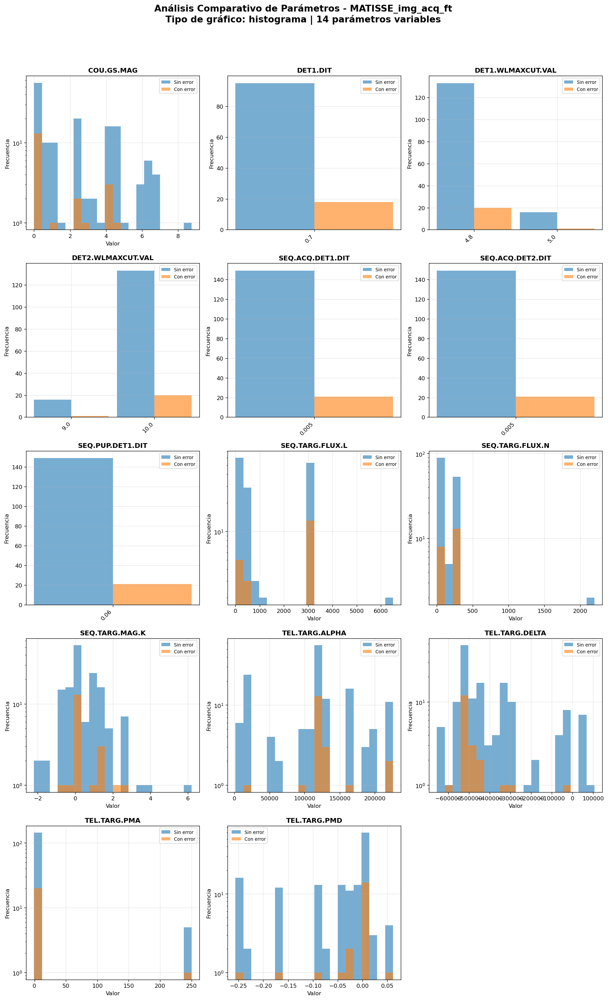

Creando gráficos tipo 'histograma' para 4 parámetros NO constantes...
Parámetros constantes (omitidos): ['DET1.APOTYPE.VAL', 'DET1.APOX.VAL', 'DET1.APOY.VAL', 'DET1.INTERFX.VAL', 'DET1.INTERFY.VAL', 'DET1.NCOHERENT.VAL', 'DET1.NDIT', 'DET1.NINCOHERENT.VAL', 'DET1.SNRLIMIT.VAL', 'DET2.APOTYPE.VAL', 'DET2.APOX.VAL', 'DET2.APOY.VAL', 'DET2.DIT', 'DET2.INTERFX.VAL', 'DET2.INTERFY.VAL', 'DET2.NCOHERENT.VAL', 'DET2.NDIT', 'DET2.NINCOHERENT.VAL', 'DET2.SNRLIMIT.VAL', 'DET2.WLMAXCUT.VAL', 'DET2.WLMINCUT.VAL', 'INS.SFL.NAME', 'INS.SFN.NAME']


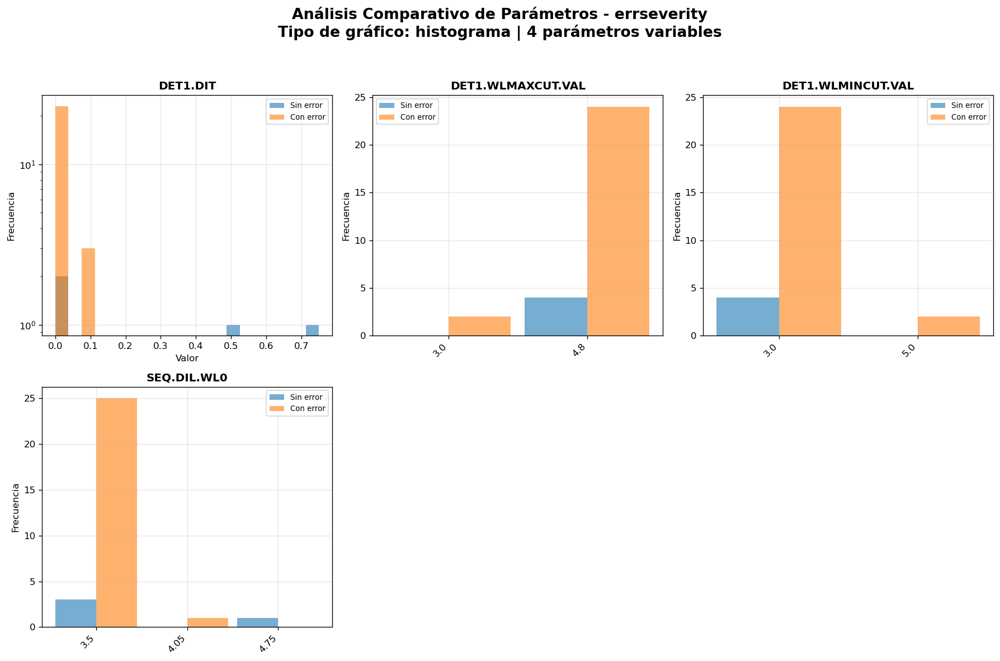

In [13]:
# ## Numéricas → Histogramas (OK vs ERR)

tpl_ids_comunes = sorted(set(tpl_params_dict_ok) & set(tpl_params_dict_err))

for tpl_id_str in tpl_ids_comunes:
    df_ok  = tpl_params_dict_ok[tpl_id_str]
    df_err = tpl_params_dict_err[tpl_id_str]

    if df_ok.empty or df_err.empty:
        print(f"{tpl_id_str}: DataFrames vacíos (OK: {len(df_ok)}, ERR: {len(df_err)})")
        continue

    # Intersección de columnas
    columnas_comunes = sorted(set(df_ok.columns) & set(df_err.columns))
    if not columnas_comunes:
        print(f"{tpl_id_str}: No hay columnas comunes")
        continue

    # Forzar numérico para emular read_csv y evitar 'object'
    df_ok_num  = df_ok[columnas_comunes].apply(pd.to_numeric, errors="coerce")
    df_err_num = df_err[columnas_comunes].apply(pd.to_numeric, errors="coerce")

    cols_num = sorted(
        set(df_ok_num.select_dtypes(include="number").columns) &
        set(df_err_num.select_dtypes(include="number").columns)
    )
    if not cols_num:
        print(f"{tpl_id_str}: Sin columnas numéricas comunes para histograma")
        continue

    # Graficar histogramas
    graficos_por_columna(
        df_ok_num[cols_num],
        df_err_num[cols_num],
        nombre_archivo=tpl_id_str,
        tipo="histograma",
        log_y=True
    )



## 2. Extracción y Codificación de Parámetros Categóricos

Se extraen los parametros con valor categoricos, para posteriormente codificarlos numéricamente y visualizar los resultados.

### Extracción de Parámetros Categóricos (strval) en Memoria
Se extraen los parámetros categóricos de las trazas y se almacenan directamente en diccionarios de DataFrames en memoria. 

In [14]:
tpl_strval_dict_ok = {}
tpl_strval_dict_err = {}

for tpl_id in TPL:
    strval_df_ok = extract_trace_categoricals(df_meta_2, df_traces, extract_params, tpl_id=tpl_id)

    if not strval_df_ok.empty:
        tpl_strval_dict_ok[tpl_id] = strval_df_ok
   
    strval_df_err = extract_trace_categoricals(
        df_meta_Error,
        df_traces,
        extract_params,
        tpl_id=tpl_id
    )

    if not strval_df_err.empty:
        tpl_strval_dict_err[tpl_id] = strval_df_err


### Codificación de Parámetros Categóricos en Memoria
Se aplica una codificación numérica a los parámetros categóricos directamente desde los DataFrames en memoria.

In [15]:
codified_strval_ok_dfs, dict_codificacion_ok = procesar_strval_in_memory(
    tpl_strval_dict_ok
)

codified_strval_err_dfs, dict_codificacion_err = procesar_strval_in_memory(
    tpl_strval_dict_err
)

print("\nCodificación de categóricas completada.")


Codificación de categóricas completada.


### Gráficos de Parámetros Categóricos Codificados
Se generan gráficos de pie para los parámetros categóricos ya codificados, comparando las observaciones con y sin error. Se aplica el mismo filtro de parámetros constantes que en la sección de numéricos, utilizando los DataFrames en memoria.

Creando gráficos tipo 'pie' para 8 parámetros NO constantes...
Parámetros constantes (omitidos): ['INS.SFL.NAME', 'INS.SFN.NAME', 'SEQ.DET.TRIG.ST', 'SEQ.DIL.WL0', 'SEQ.IMG.DIT', 'SEQ.IMG.NDIT']


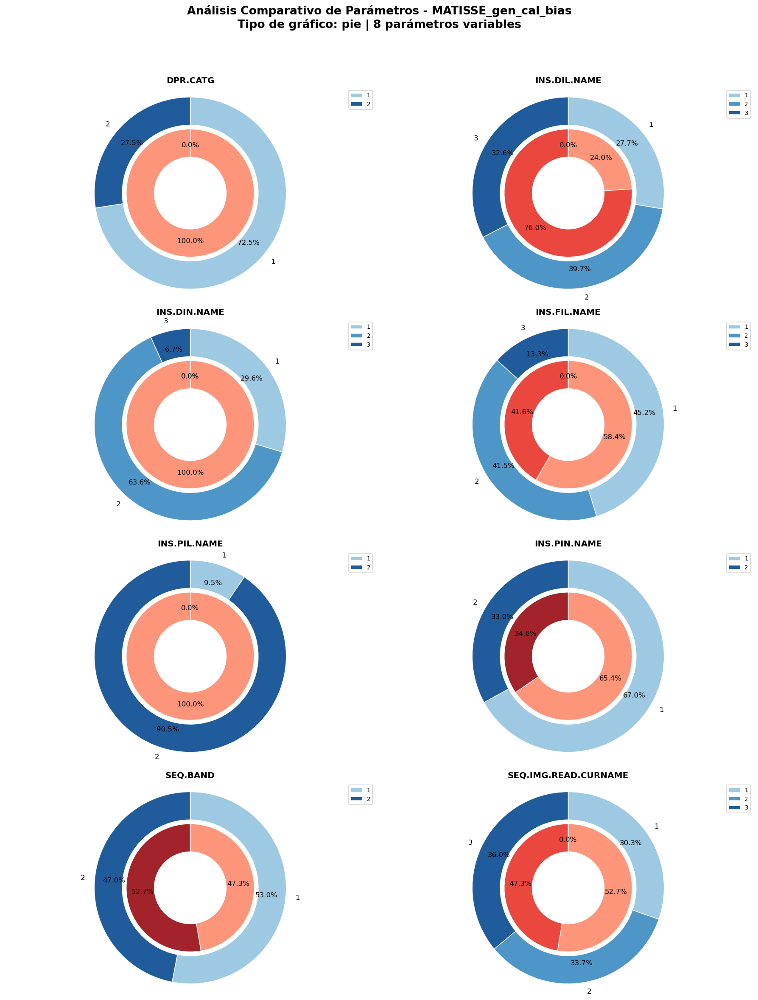

Creando gráficos tipo 'pie' para 6 parámetros NO constantes...
Parámetros constantes (omitidos): ['DET2.DIT', 'DET2.NDIT', 'DET2.NDITSKIP', 'DET2.PERIOD', 'DET2.TDELAY', 'DET2.WIN.MTCS1', 'DET2.WIN.MTCW1', 'DET2.WIN.MTRH1', 'DET2.WIN.MTRS1', 'DPR.TECH', 'SEQ.DARK.INS.FIN.NAME', 'SEQ.DARK.INS.PIN.NAME', 'SEQ.DARK.INS.PON.NAME', 'SEQ.FLAT.INS.FIN.NAME', 'SEQ.FLAT.INS.PIN.NAME', 'SEQ.FLAT.INS.PON.NAME', 'SEQ.LAMP.COOLDOWN', 'SEQ.LAMP.WARMUP']


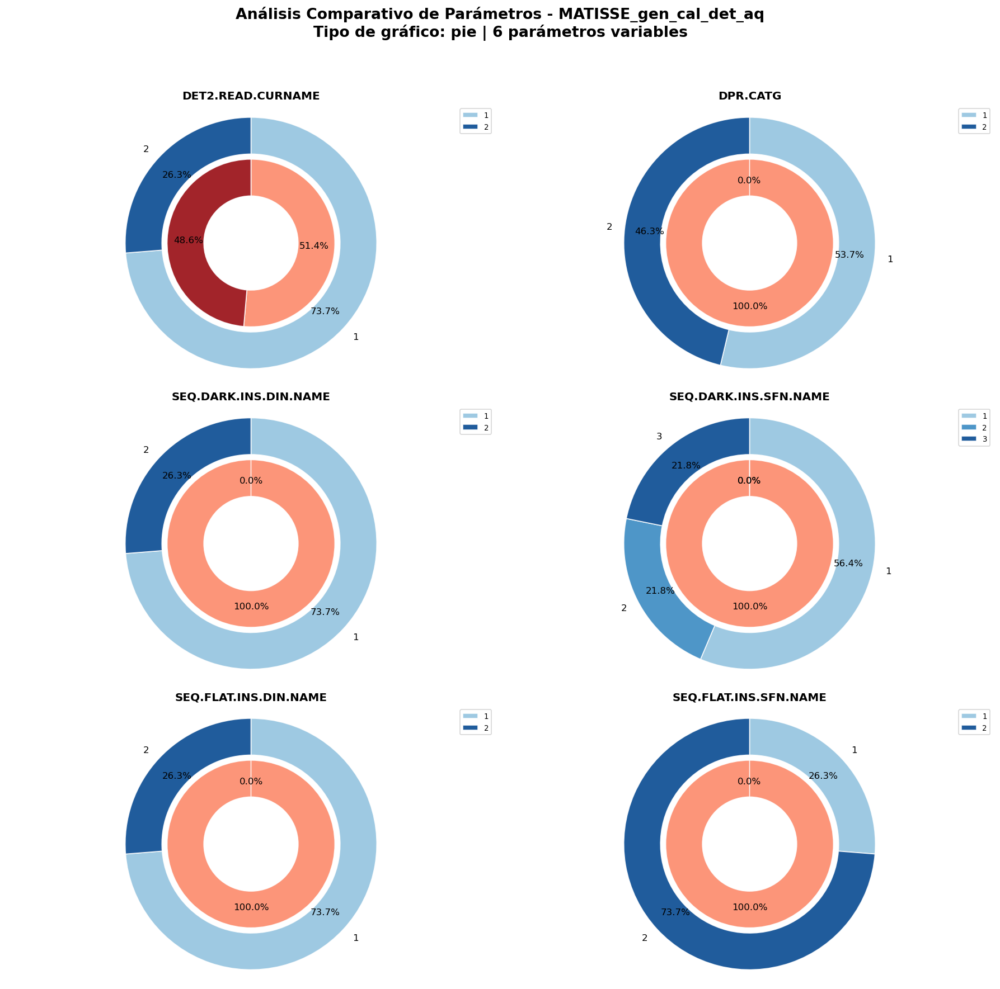

Creando gráficos tipo 'pie' para 4 parámetros NO constantes...
Parámetros constantes (omitidos): ['DET1.NDIT', 'DET1.NDITSKIP', 'DET1.PERIOD', 'DET1.TDELAY', 'DET1.WIN.MTCS1', 'DET1.WIN.MTCW1', 'DET1.WIN.MTRH1', 'DET1.WIN.MTRS1', 'DPR.TECH', 'SEQ.DARK.INS.DIL.NAME', 'SEQ.DARK.INS.FIL.NAME', 'SEQ.DARK.INS.PIL.NAME', 'SEQ.DARK.INS.POL.NAME', 'SEQ.DARK.INS.SFL.NAME', 'SEQ.DITMAX', 'SEQ.DITMIN', 'SEQ.FLAT.INS.PIL.NAME', 'SEQ.FLAT.INS.POL.NAME', 'SEQ.FLAT.INS.SFL.NAME', 'SEQ.LAMP.COOLDOWN', 'SEQ.LAMP.WARMUP']


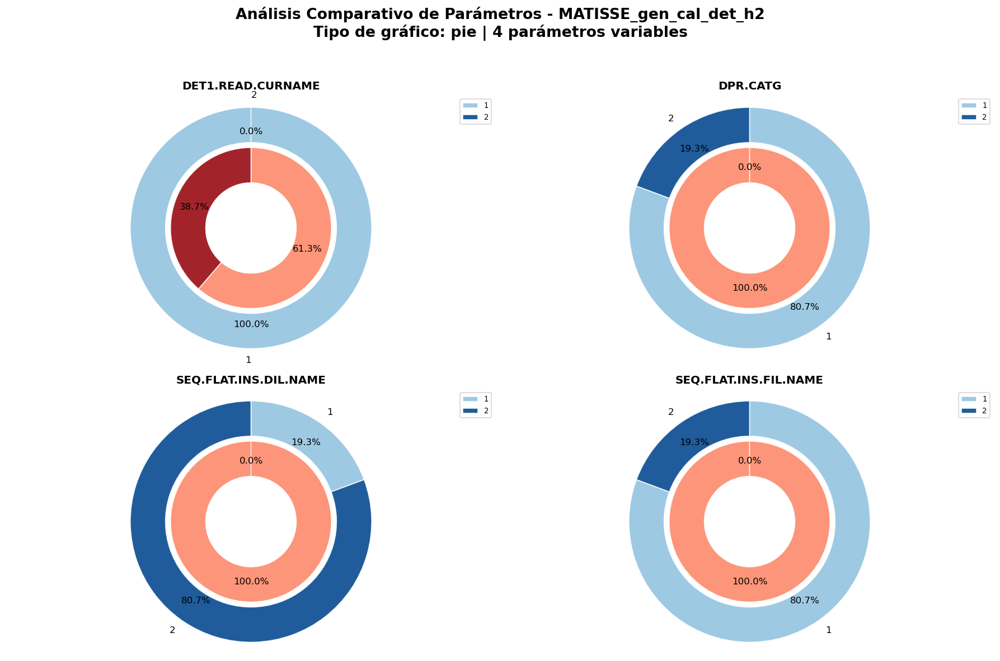

Creando gráficos tipo 'pie' para 1 parámetros NO constantes...
Parámetros constantes (omitidos): ['DET1.DIT', 'DET1.NDIT', 'DET1.NDITSKIP', 'DET1.PERIOD', 'DET1.READ.CURNAME', 'DET1.TDELAY', 'DET1.WIN.MTCS.LIST', 'DET1.WIN.MTCW.LIST', 'DET1.WIN.MTRH.LIST', 'DET1.WIN.MTRS.LIST', 'DET1.WIN.NCOL', 'DET1.WIN.NROW', 'DET2.DIT', 'DET2.NDIT', 'DET2.NDITSKIP', 'DET2.PERIOD', 'DET2.READ.CURNAME', 'DET2.TDELAY', 'DET2.WIN.MTCS.LIST', 'DET2.WIN.MTCW.LIST', 'DET2.WIN.MTRH.LIST', 'DET2.WIN.MTRS.LIST', 'DET2.WIN.NCOL', 'DET2.WIN.NROW', 'DPR.CATG', 'DPR.TYPE', 'INS.DIL.NAME', 'INS.DIN.NAME', 'INS.FIL.NAME', 'INS.FIN.NAME', 'INS.PIL.NAME', 'INS.PIN.NAME', 'INS.POL.NAME', 'INS.PON.NAME', 'INS.SFL.NAME', 'INS.SFN.NAME', 'SEQ.LAMP.COOLDOWN']


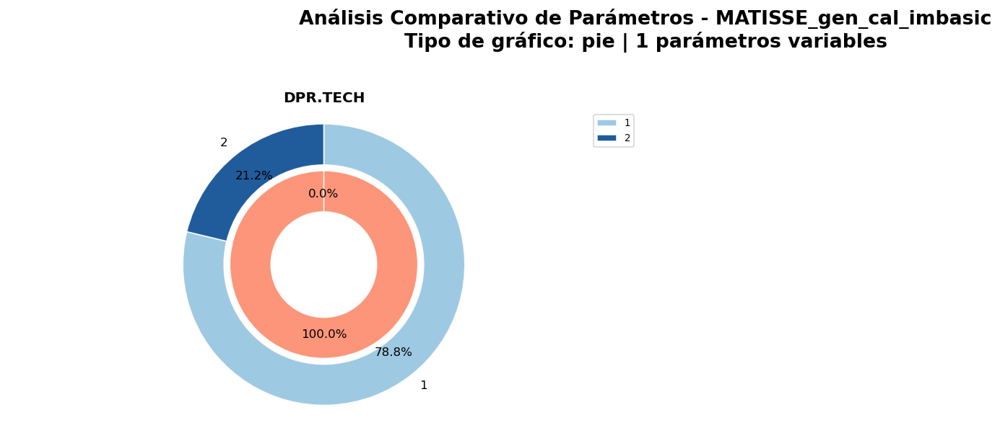

Creando gráficos tipo 'pie' para 3 parámetros NO constantes...
Parámetros constantes (omitidos): ['DET1.DIT', 'DET1.NDIT', 'DET2.DIT', 'DET2.NDIT', 'DET2.READ.CURNAME', 'DPR.CATG', 'DPR.TECH', 'INS.DIN.NAME', 'INS.FIN.NAME', 'INS.POL.NAME', 'INS.PON.NAME', 'INS.SFL.NAME', 'INS.SFN.NAME', 'SEQ.BAND', 'SEQ.SIMUL.ST']


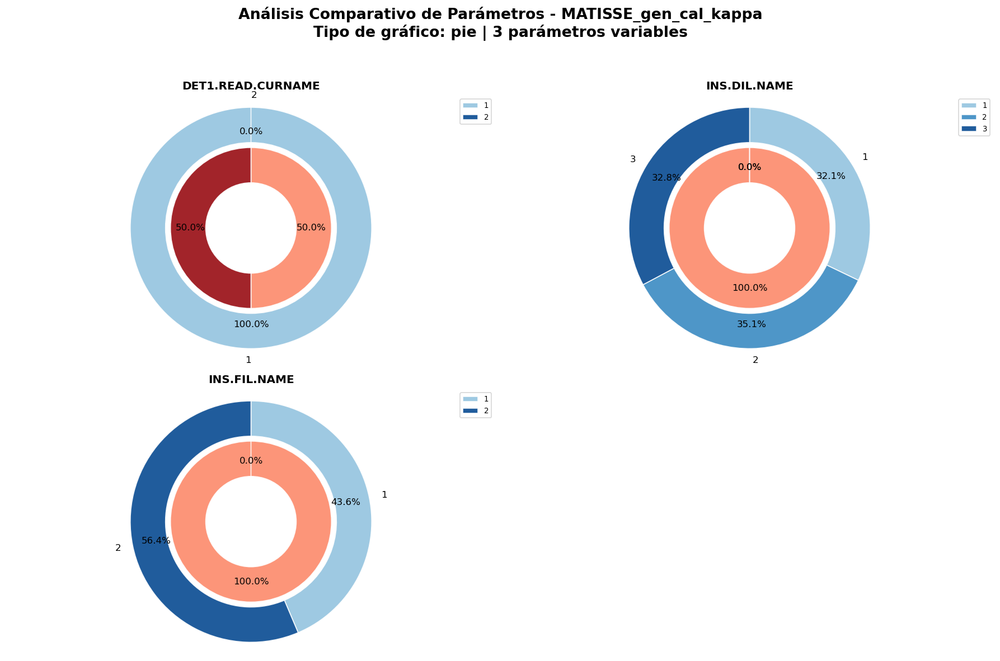

Creando gráficos tipo 'pie' para 6 parámetros NO constantes...
Parámetros constantes (omitidos): ['DET1.DIT', 'DET1.NDIT', 'DET2.DIT', 'DET2.NDIT', 'DET2.READ.CURNAME', 'INS.POL.NAME', 'INS.PON.NAME', 'SEQ.SIMUL.ST']


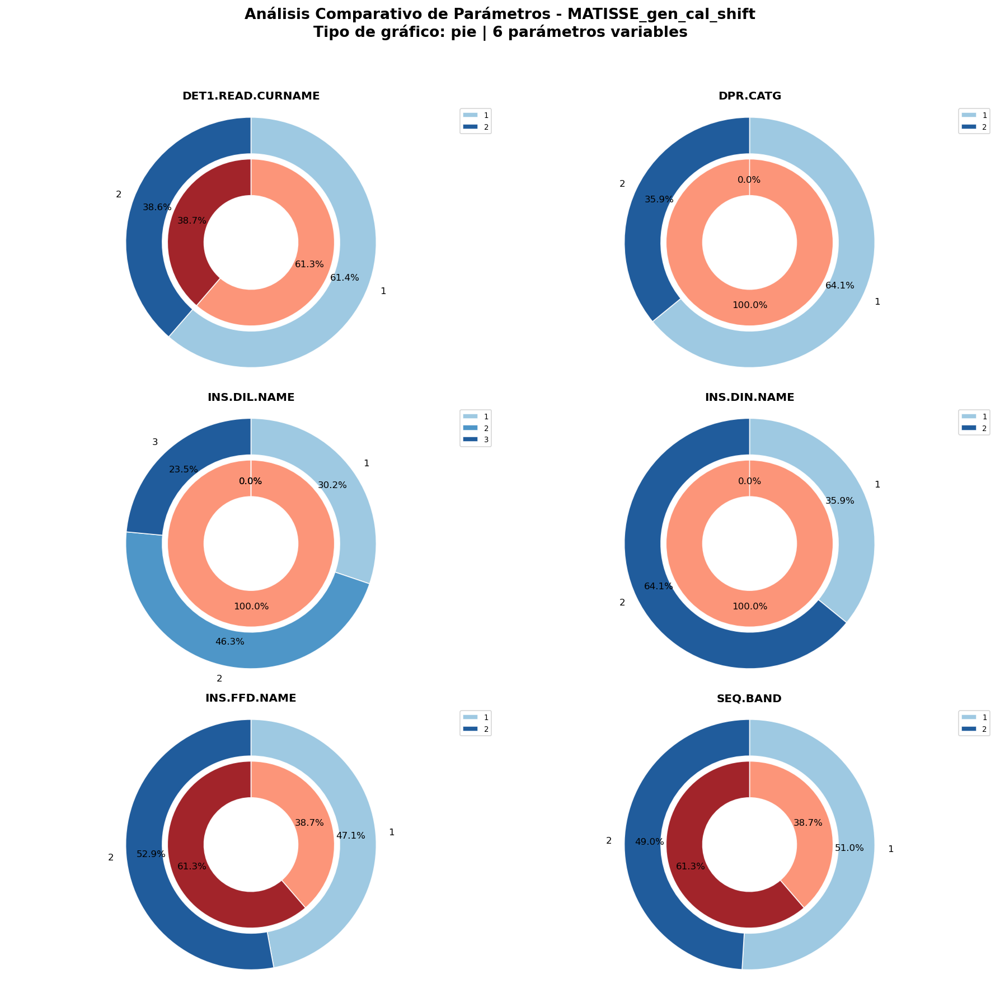

Creando gráficos tipo 'pie' para 6 parámetros NO constantes...
Parámetros constantes (omitidos): ['DET1.APOTYPE.VAL', 'DET1.APOX.VAL', 'DET1.APOY.VAL', 'DET1.DIT', 'DET1.INTERFX.VAL', 'DET1.INTERFY.VAL', 'DET1.NCOHERENT.VAL', 'DET1.NINCOHERENT.VAL', 'DET1.READ.CURNAME', 'DET1.SNRLIMIT.VAL', 'DET1.WLMAXCUT.VAL', 'DET1.WLMINCUT.VAL', 'DET2.APOTYPE.VAL', 'DET2.APOX.VAL', 'DET2.APOY.VAL', 'DET2.DIT', 'DET2.INTERFX.VAL', 'DET2.INTERFY.VAL', 'DET2.NCOHERENT.VAL', 'DET2.NINCOHERENT.VAL', 'DET2.READ.CURNAME', 'DET2.SNRLIMIT.VAL', 'DET2.WLMAXCUT.VAL', 'DET2.WLMINCUT.VAL', 'INS.FIL.NAME', 'INS.FIN.NAME', 'INS.POL.NAME', 'INS.PON.NAME', 'INS.SFL.NAME', 'INS.SFN.NAME', 'SEQ.CHOP.ST', 'SEQ.DARK.DURATION', 'SEQ.DIL.WL0', 'SEQ.FRINGES.BCD.SEQ', 'SEQ.FRINGES.DURATION', 'SEQ.FRINGES.NCYCLES', 'SEQ.INCOHERENT.ST', 'SEQ.OBS.MODE', 'SEQ.OPDM.L.WLMAX', 'SEQ.OPDM.N.WLMAX', 'SEQ.OPDM.NSTEPS', 'SEQ.OSF.AUTO', 'SEQ.PHOTO.DURATION', 'SEQ.RMNREC.ST', 'SEQ.SIMUL.ST', 'SEQ.SKY.DURATION', 'SEQ.TRACK.BAND', 'SEQ.TRA

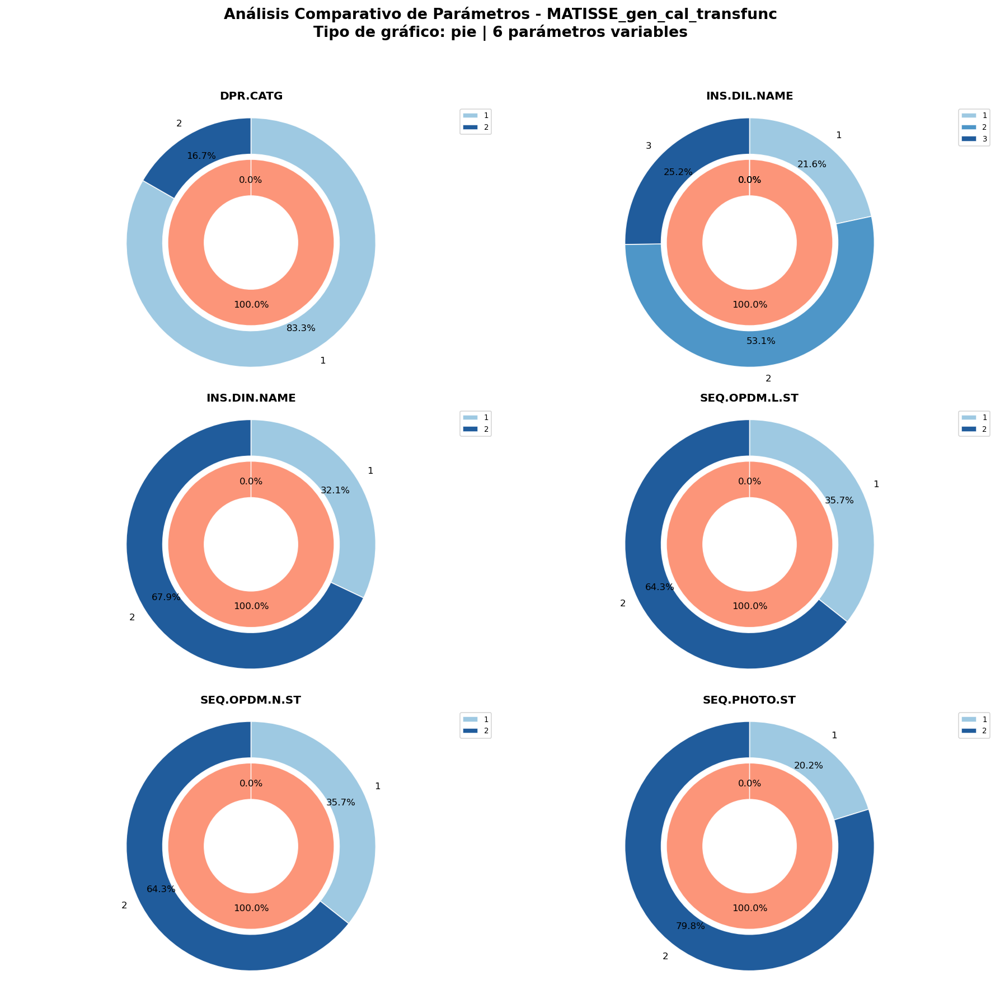

Creando gráficos tipo 'pie' para 7 parámetros NO constantes...
Parámetros constantes (omitidos): ['DPR.TECH', 'SEQ.IMG.DIT', 'SEQ.IMG.NDIT', 'SEQ.IMG.REF.DIT', 'SEQ.IMG.REF.NDIT', 'SEQ.PUP.DIT', 'SEQ.PUP.NDIT', 'SEQ.PUP.REF.DIT', 'SEQ.PUP.REF.NDIT']


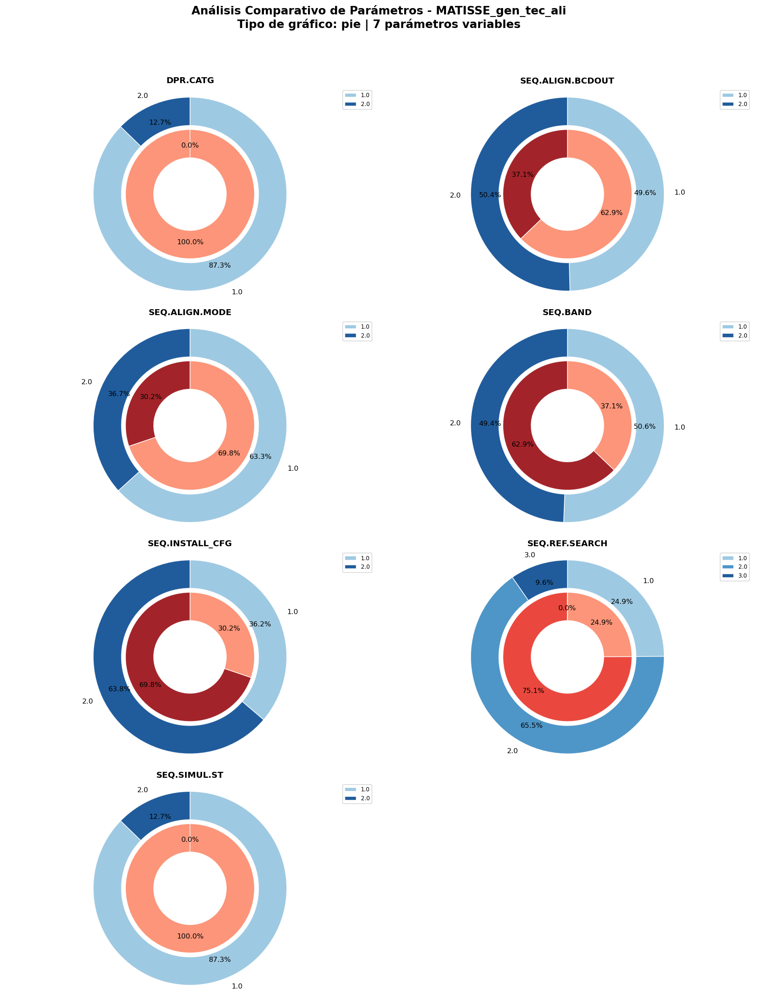

Creando gráficos tipo 'pie' para 5 parámetros NO constantes...
Parámetros constantes (omitidos): ['DET1.APOTYPE.VAL', 'DET1.APOX.VAL', 'DET1.APOY.VAL', 'DET1.DIT', 'DET1.INTERFX.VAL', 'DET1.INTERFY.VAL', 'DET1.NCOHERENT.VAL', 'DET1.NDIT', 'DET1.NINCOHERENT.VAL', 'DET1.SNRLIMIT.VAL', 'DET1.WLMAXCUT.VAL', 'DET1.WLMINCUT.VAL', 'DET2.APOTYPE.VAL', 'DET2.APOX.VAL', 'DET2.APOY.VAL', 'DET2.INTERFX.VAL', 'DET2.INTERFY.VAL', 'DET2.NCOHERENT.VAL', 'DET2.NDIT', 'DET2.NINCOHERENT.VAL', 'DET2.READ.CURNAME', 'DET2.SNRLIMIT.VAL', 'DET2.WLMAXCUT.VAL', 'DET2.WLMINCUT.VAL', 'DPR.TECH', 'INS.DIL.NAME', 'INS.DIN.NAME', 'INS.FIN.NAME', 'INS.PIL.NAME', 'INS.PIN.NAME', 'INS.POL.NAME', 'INS.PON.NAME', 'INS.SFL.NAME', 'INS.SFN.NAME', 'SEQ.DIL.WL0', 'SEQ.SIMUL.ST']


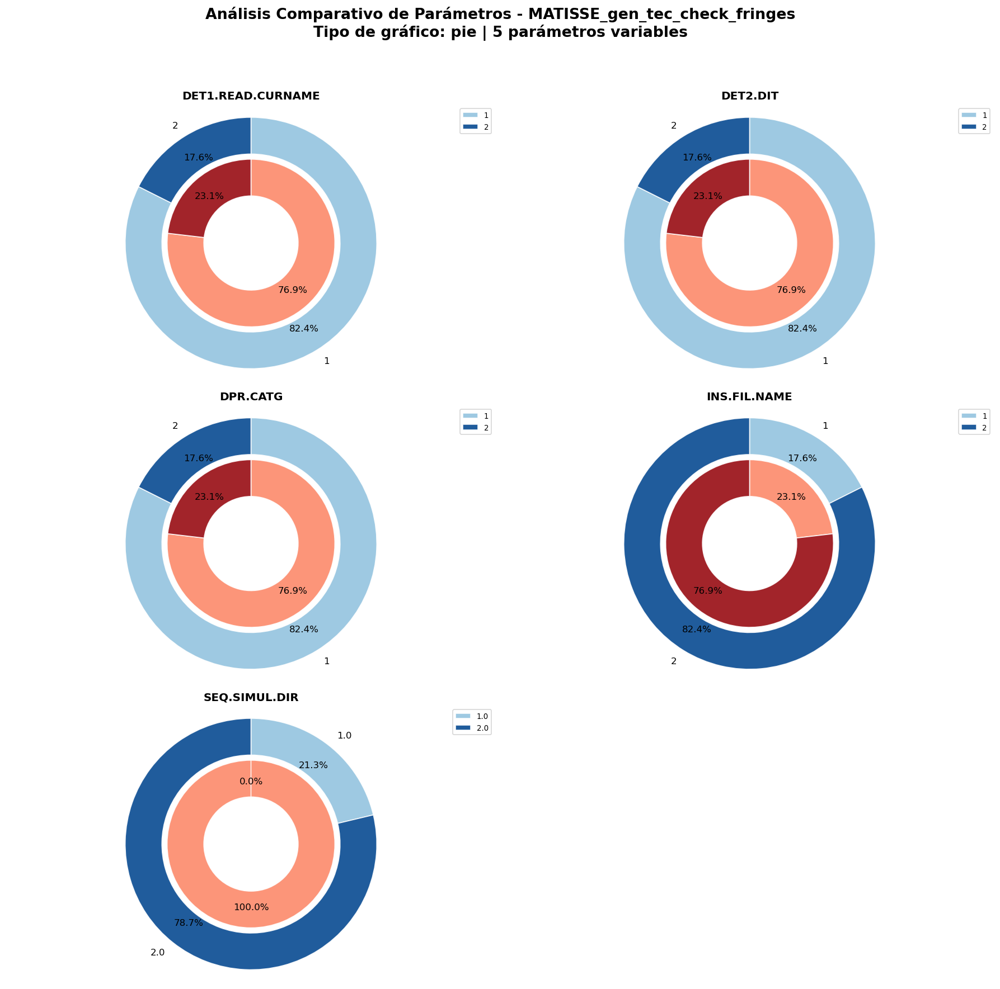

Creando gráficos tipo 'pie' para 12 parámetros NO constantes...
Parámetros constantes (omitidos): ['DET1.APOTYPE.VAL', 'DET1.APOX.VAL', 'DET1.APOY.VAL', 'DET1.DIT', 'DET1.INTERFX.VAL', 'DET1.INTERFY.VAL', 'DET1.NCOHERENT.VAL', 'DET1.NDIT', 'DET1.NINCOHERENT.VAL', 'DET1.SNRLIMIT.VAL', 'DET1.WLMAXCUT.VAL', 'DET1.WLMINCUT.VAL', 'DET2.APOTYPE.VAL', 'DET2.APOX.VAL', 'DET2.APOY.VAL', 'DET2.INTERFX.VAL', 'DET2.INTERFY.VAL', 'DET2.NCOHERENT.VAL', 'DET2.NDIT', 'DET2.NINCOHERENT.VAL', 'DET2.SNRLIMIT.VAL', 'DET2.WLMAXCUT.VAL', 'DET2.WLMINCUT.VAL', 'DPR.TECH', 'INS.FIN.NAME', 'INS.PIL.NAME', 'INS.POL.NAME', 'INS.PON.NAME', 'INS.SFL.NAME', 'INS.SFN.NAME', 'SEQ.ALIGN.MODE', 'SEQ.SIMUL.ST']


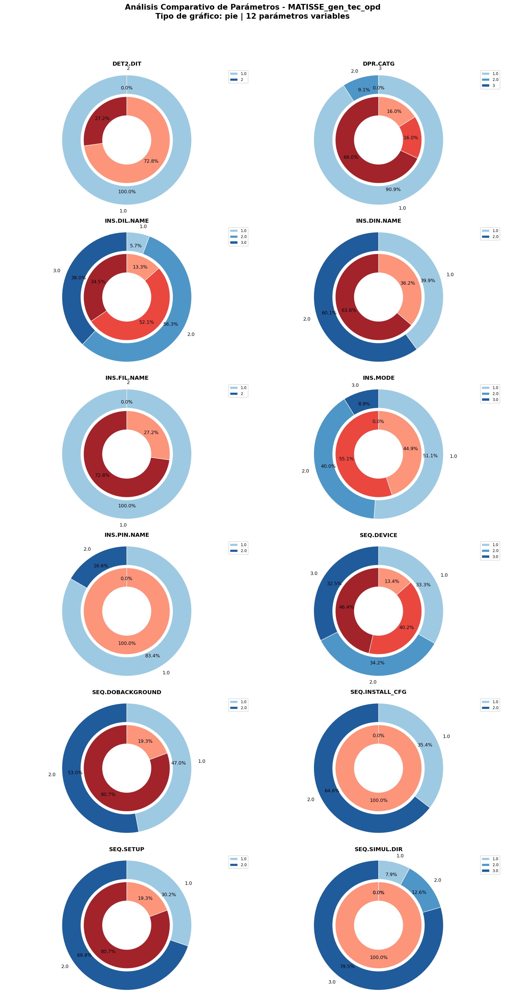

Creando gráficos tipo 'pie' para 4 parámetros NO constantes...
Parámetros constantes (omitidos): ['DET1.DIT', 'DET1.NDIT', 'DET1.READ.CURNAME', 'DET2.DIT', 'DET2.NDIT', 'DET2.READ.CURNAME', 'DPR.TECH', 'INS.DIL.NAME', 'INS.DIN.NAME', 'INS.FIL.NAME', 'INS.FIN.NAME', 'INS.PIL.NAME', 'INS.PIN.NAME', 'INS.POL.NAME', 'INS.PON.NAME', 'INS.SFL.NAME', 'INS.SFN.NAME', 'SEQ.DEV.LIST', 'SEQ.PZT.END', 'SEQ.PZT.START', 'SEQ.PZT.STEP']


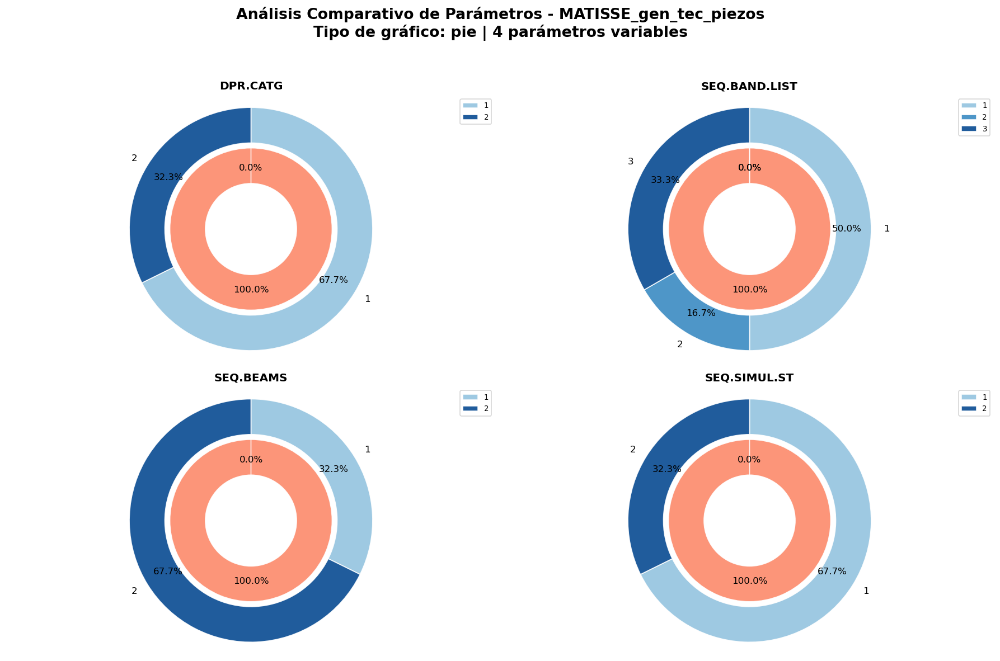

Creando gráficos tipo 'pie' para 22 parámetros NO constantes...
Parámetros constantes (omitidos): ['DET1.APOTYPE.VAL', 'DET1.APOX.VAL', 'DET1.APOY.VAL', 'DET1.INTERFX.VAL', 'DET1.INTERFY.VAL', 'DET1.NCOHERENT.VAL', 'DET1.NINCOHERENT.VAL', 'DET1.SNRLIMIT.VAL', 'DET1.WLMAXCUT.VAL', 'DET1.WLMINCUT.VAL', 'DET2.APOTYPE.VAL', 'DET2.APOX.VAL', 'DET2.APOY.VAL', 'DET2.INTERFX.VAL', 'DET2.INTERFY.VAL', 'DET2.NCOHERENT.VAL', 'DET2.NINCOHERENT.VAL', 'DET2.READ.CURNAME', 'DET2.SNRLIMIT.VAL', 'DET2.WLMAXCUT.VAL', 'DET2.WLMINCUT.VAL', 'INS.FIN.NAME', 'INS.POL.NAME', 'INS.PON.NAME', 'SEQ.DIL.WL0', 'SEQ.FRINGES.DURATION', 'SEQ.FRINGES.NCYCLES', 'SEQ.OPDM.L.WLMAX', 'SEQ.OPDM.N.WLMAX', 'SEQ.PHOTO.DURATION', 'SEQ.RMNREC.ST', 'SEQ.SKY.DURATION', 'SEQ.SKY.OFFS.ALPHA', 'SEQ.SKY.OFFS.DELTA', 'TEL.CHOP.FREQ', 'TEL.CHOP.POSANG', 'TEL.CHOP.PVRATIO', 'TEL.CHOP.THROW']


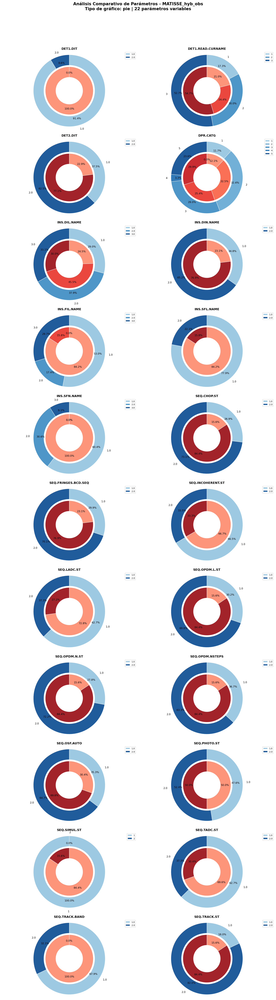

Creando gráficos tipo 'pie' para 19 parámetros NO constantes...
Parámetros constantes (omitidos): ['COU.AG.ALPHA', 'COU.AG.DELTA', 'COU.AG.EPOCH', 'COU.AG.EQUINOX', 'COU.AG.PMA', 'COU.AG.PMD', 'COU.GS.MAG', 'DEL.REF.MODE', 'DEL.REF.OPL', 'DET1.APOTYPE.VAL', 'DET1.APOX.VAL', 'DET1.APOY.VAL', 'DET1.INTERFX.VAL', 'DET1.INTERFY.VAL', 'DET1.NCOHERENT.VAL', 'DET1.NINCOHERENT.VAL', 'DET1.SNRLIMIT.VAL', 'DET1.WLMAXCUT.VAL', 'DET1.WLMINCUT.VAL', 'DET2.APOTYPE.VAL', 'DET2.APOX.VAL', 'DET2.APOY.VAL', 'DET2.INTERFX.VAL', 'DET2.INTERFY.VAL', 'DET2.NCOHERENT.VAL', 'DET2.NINCOHERENT.VAL', 'DET2.READ.CURNAME', 'DET2.SNRLIMIT.VAL', 'DET2.WLMAXCUT.VAL', 'DET2.WLMINCUT.VAL', 'SEQ.ACQ.DET1.DIT', 'SEQ.ACQ.DET2.DIT', 'SEQ.ACQ.INS.FIL.NAME', 'SEQ.ACQ.INS.FIN.NAME', 'SEQ.ACQ.SKY.DURATION', 'SEQ.ACQ.TARG.DURATION', 'SEQ.DIL.WL0', 'SEQ.FS.DET1.DIT', 'SEQ.FS.INS.DIN.NAME', 'SEQ.FS.INS.FIL.NAME', 'SEQ.FS.INS.FIN.NAME', 'SEQ.FS.INS.SFL.NAME', 'SEQ.FS.SKY.DURATION', 'SEQ.FS.TARG.DURATION', 'SEQ.OPDM.L.ST', 'SEQ.OPD

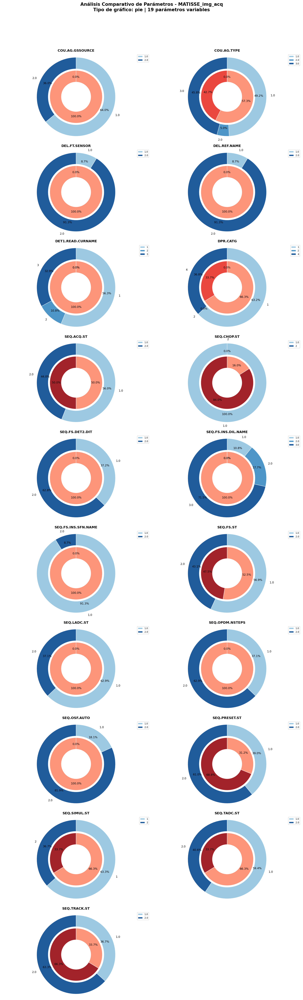

Creando gráficos tipo 'pie' para 9 parámetros NO constantes...
Parámetros constantes (omitidos): ['COU.AG.ALPHA', 'COU.AG.DELTA', 'COU.AG.EPOCH', 'COU.AG.EQUINOX', 'COU.AG.GSSOURCE', 'COU.AG.PMA', 'COU.AG.PMD', 'COU.AG.TYPE', 'COU.GS.MAG', 'DEL.FT.SENSOR', 'DEL.REF.MODE', 'DEL.REF.NAME', 'DEL.REF.OPL', 'DET1.APOTYPE.VAL', 'DET1.APOX.VAL', 'DET1.APOY.VAL', 'DET1.DIT', 'DET1.INTERFX.VAL', 'DET1.INTERFY.VAL', 'DET1.NCOHERENT.VAL', 'DET1.NINCOHERENT.VAL', 'DET1.SNRLIMIT.VAL', 'DET1.WLMAXCUT.VAL', 'DET1.WLMINCUT.VAL', 'DET2.APOTYPE.VAL', 'DET2.APOX.VAL', 'DET2.APOY.VAL', 'DET2.DIT', 'DET2.INTERFX.VAL', 'DET2.INTERFY.VAL', 'DET2.NCOHERENT.VAL', 'DET2.NDIT.SKY', 'DET2.NINCOHERENT.VAL', 'DET2.READ.CURNAME', 'DET2.SNRLIMIT.VAL', 'DET2.WLMAXCUT.VAL', 'DET2.WLMINCUT.VAL', 'INS.FT.POL', 'INS.SPEC.POL', 'INS.SPEC.RES', 'INS.STSOFFANG', 'SEQ.ACQ.DET1.DIT', 'SEQ.ACQ.DET2.DIT', 'SEQ.ACQ.INS.FIL.NAME', 'SEQ.ACQ.INS.FIN.NAME', 'SEQ.ACQ.SKY.DURATION', 'SEQ.ACQ.TARG.DURATION', 'SEQ.CHOP.ST', 'SEQ.DIL.WL0'

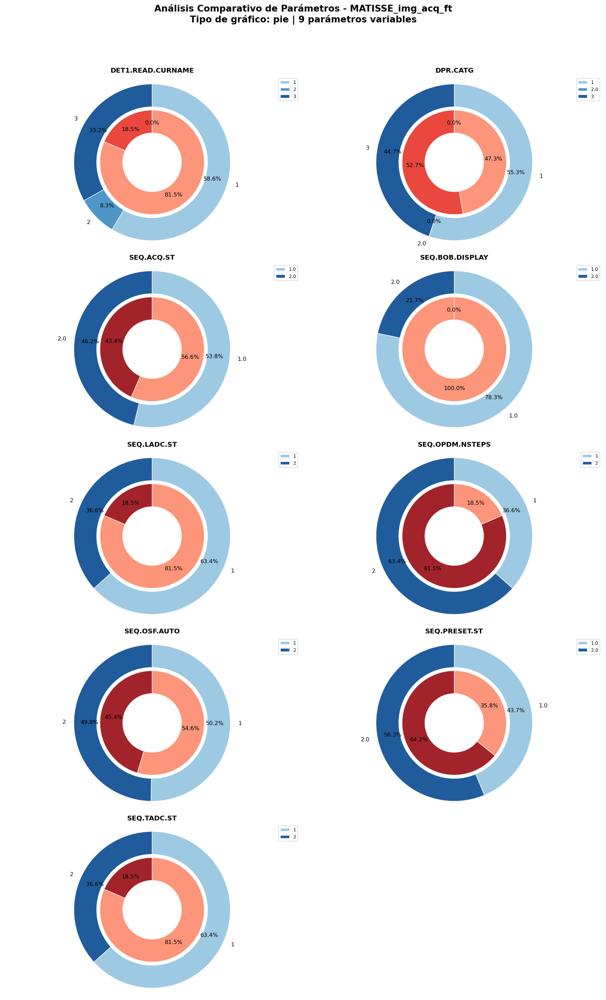

Creando gráficos tipo 'pie' para 7 parámetros NO constantes...
Parámetros constantes (omitidos): ['DET1.APOTYPE.VAL', 'DET1.APOX.VAL', 'DET1.APOY.VAL', 'DET1.DIT', 'DET1.INTERFX.VAL', 'DET1.INTERFY.VAL', 'DET1.NCOHERENT.VAL', 'DET1.NDIT', 'DET1.NINCOHERENT.VAL', 'DET1.SNRLIMIT.VAL', 'DET1.WLMAXCUT.VAL', 'DET1.WLMINCUT.VAL', 'DET2.APOTYPE.VAL', 'DET2.APOX.VAL', 'DET2.APOY.VAL', 'DET2.DIT', 'DET2.INTERFX.VAL', 'DET2.INTERFY.VAL', 'DET2.NCOHERENT.VAL', 'DET2.NDIT', 'DET2.NINCOHERENT.VAL', 'DET2.READ.CURNAME', 'DET2.SNRLIMIT.VAL', 'DET2.WLMAXCUT.VAL', 'DET2.WLMINCUT.VAL', 'INS.FIN.NAME', 'INS.PIL.NAME', 'INS.POL.NAME', 'INS.PON.NAME', 'SEQ.DIL.WL0']


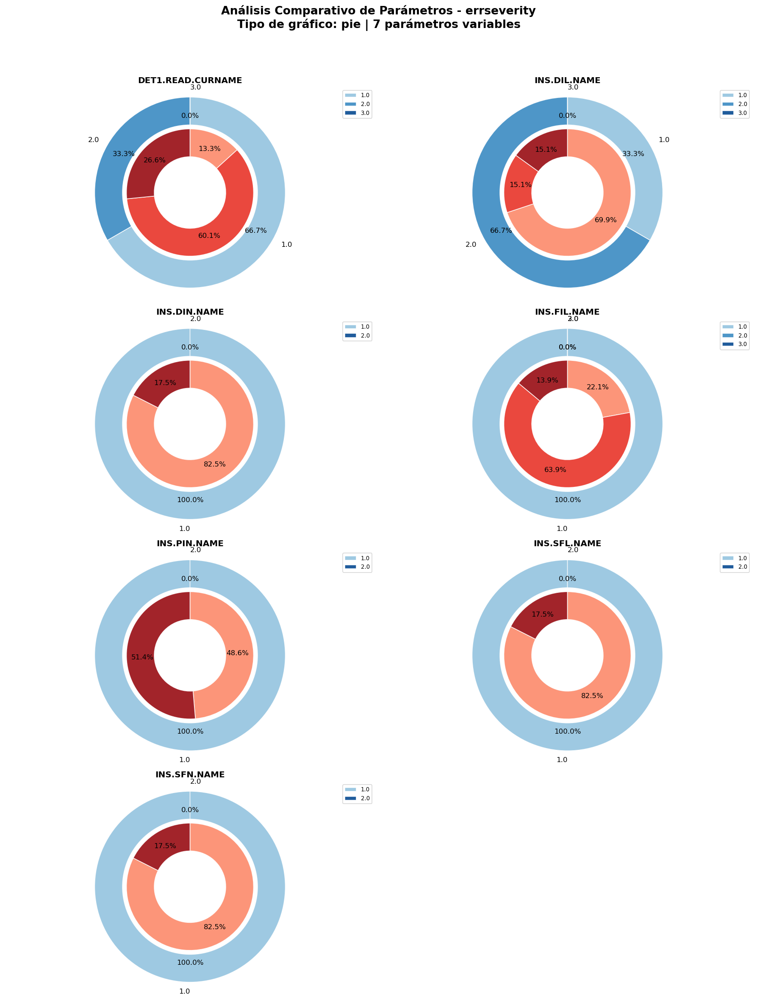

In [16]:
THRESHOLD_NAN = 0.5 
tpl_ids_comunes_cat = sorted(set(codified_strval_ok_dfs.keys()) & set(codified_strval_err_dfs.keys()))

for tpl_id_str in tpl_ids_comunes_cat:
    df_ok_codified  = codified_strval_ok_dfs.get(tpl_id_str)
    df_err_codified = codified_strval_err_dfs.get(tpl_id_str)

    if df_ok_codified is not None and not df_ok_codified.empty and \
       df_err_codified is not None and not df_err_codified.empty:

        # Limpieza por %NaN en columnas y filas (igual a tu esquema)
        df_ok_cleaned = df_ok_codified.loc[:, df_ok_codified.isna().mean() < THRESHOLD_NAN]
        df_ok_cleaned = df_ok_cleaned.loc[df_ok_cleaned.isna().mean(axis=1) < THRESHOLD_NAN, :]

        df_err_cleaned = df_err_codified.loc[:, df_err_codified.isna().mean() < THRESHOLD_NAN]
        df_err_cleaned = df_err_cleaned.loc[df_err_cleaned.isna().mean(axis=1) < THRESHOLD_NAN, :]

        if not df_ok_cleaned.empty and not df_err_cleaned.empty:
            columns = sorted(set(df_ok_cleaned.columns) & set(df_err_cleaned.columns))
            if columns:
                # Pie (categóricas): anillo EXTERNO = OK (azul), INTERNO = ERR (rojo)
                graficos_por_columna(
                    df_ok_cleaned[columns],
                    df_err_cleaned[columns],
                    nombre_archivo=tpl_id_str,
                    tipo="pie",
                    use_log=True
                )
            else:
                print(f"{tpl_id_str}: No hay columnas comunes después de la limpieza.")
        else:
            print(f"{tpl_id_str}: DataFrame vacío después de la limpieza. Se omite.")
    else:
        print(f"{tpl_id_str}: No se encontraron DataFrames codificados válidos. Se omite.")


## 3. Normalización, Reducción de Dimensionalidad (t-SNE/UMAP) y Clustering (DBSCAN)



Se normalizan con Min-Max los datos, reducción de dimensionalidad con t-SNE y UMAP, y clustering DBSCAN.


Clustering conjunto (sin usar etiqueta) → MATISSE_hyb_obs
DBSCAN params: {'eps': np.float32(11.760191), 'min_samples': 10, 'n': 1612, 'p': 17}
origen   ERR   OK
cluster          
-1         0   48
 0         0   77
 1         1   54
 2         5   62
 3         0   24
 4         0   53
 5         0   29
 6         0   24
 7         7  118
 8         0   31
 9         1   34
 10        5  140
 11        0   13
 12        3   29
 13        1   30
 14        0   37
 15        0   19
 16       11  331
 17        1   73
 18        1   37
 19        0   48
 20        1   10
 21        0   17
 22        1   32
 23        3  101
 24        0   17
 25        0   14
 26        0   19
 27        0   22
 28        2   26


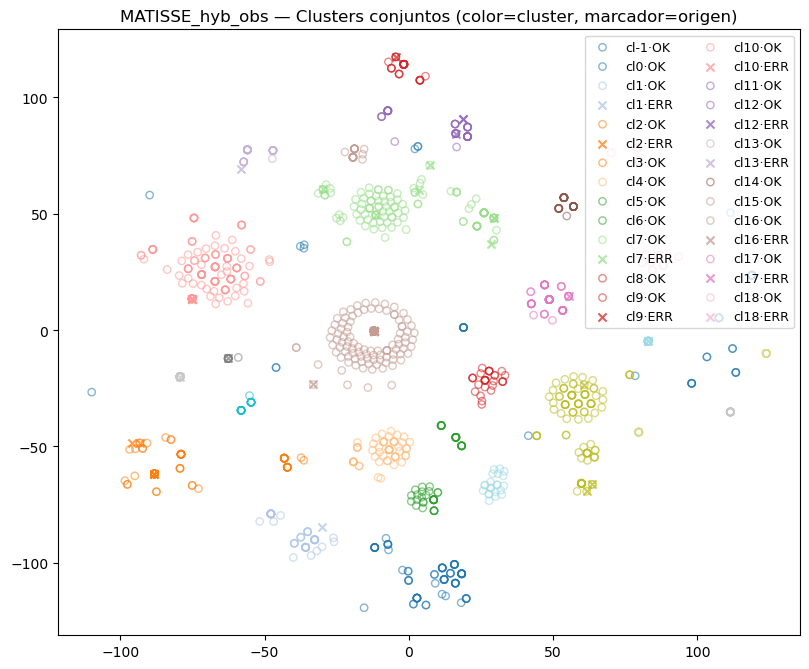


Clustering conjunto (sin usar etiqueta) → MATISSE_img_acq
DBSCAN params: {'eps': np.float32(10.970831), 'min_samples': 10, 'n': 1463, 'p': 23}
origen   ERR   OK
cluster          
-1         0   12
 0         0   62
 1         4  142
 2         0   12
 3         1   13
 4         1   62
 5         0   53
 6         1   39
 7        18  777
 8         0   10
 9         1   50
 10        1   33
 11        1   25
 12        1   30
 13        1   36
 14        3   20
 15        4   39
 16        1   10


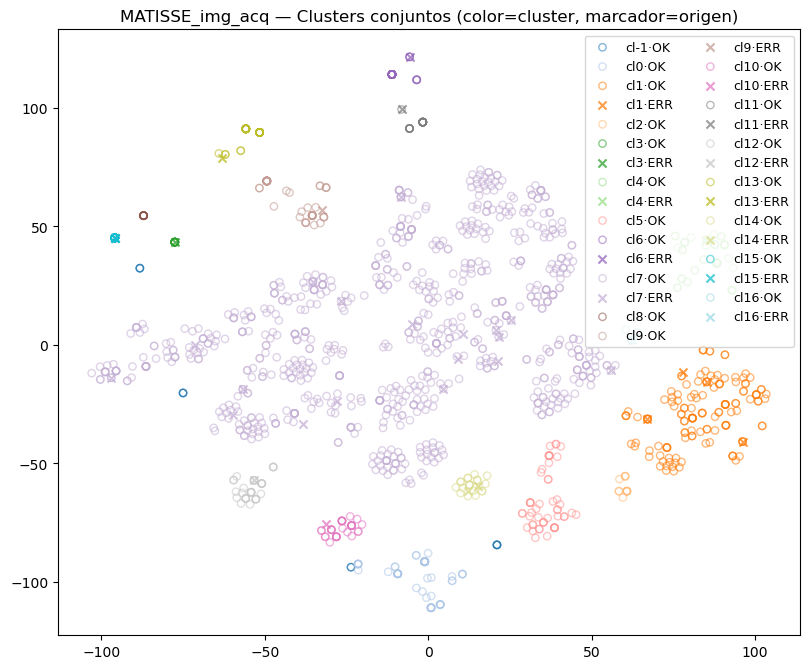


Clustering conjunto (sin usar etiqueta) → MATISSE_img_acq_ft
DBSCAN params: {'eps': np.float32(38.60599), 'min_samples': 7, 'n': 170, 'p': 10}
origen   ERR   OK
cluster          
-1        13  107
 0         6    5
 1         0   10
 2         1    7
 3         0   14
 4         1    6


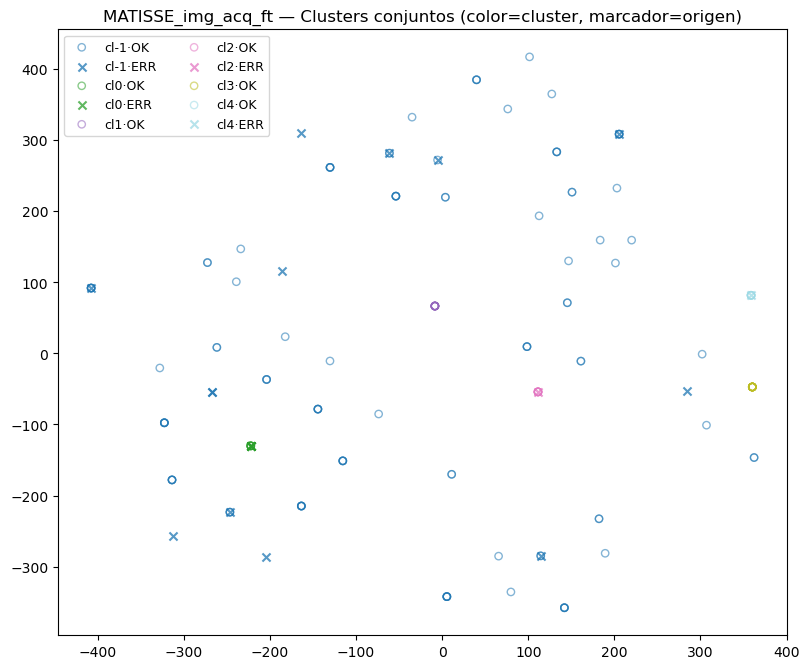

In [17]:
tpl_ids = ["MATISSE_hyb_obs", "MATISSE_img_acq", "MATISSE_img_acq_ft"]
USE_UMAP = False

for tpl in tpl_ids:
    df_ok  = tpl_params_dict_ok.get(tpl)
    df_err = tpl_params_dict_err.get(tpl)
    if df_ok is None or df_ok.empty or df_err is None or df_err.empty:
        print(f"{tpl}: falta OK o ERR; se omite.")
        continue

    print(f"\nClustering conjunto (sin usar etiqueta) → {tpl}")
    df_res, dbp = cluster_todos_en_conjunto(df_ok, df_err, use_umap=USE_UMAP)
    print("DBSCAN params:", dbp)
    print(df_res.groupby(["cluster","origen"]).size().unstack(fill_value=0))

    plot_clusters_por_cluster_y_origen(
        df_res,
        titulo=f"{tpl} — Clusters conjuntos (color=cluster, marcador=origen)"
    )
